In [10]:
if __name__ == '__main__':
    import sys
    import os
    from pathlib import Path
    curr_file_path = Path(os.path.abspath(''))
    sys.path.append(str(curr_file_path.parent))

import numpy as np
import glob2 as glob
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from sklearn.decomposition import PCA
import pickle
from sklearn.linear_model import LinearRegression
from aux_funcs import colored_line, compressed_read, logical_and


plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 14
plt.rcParams['axes.linewidth'] = 2.0

In [6]:
def load_numpy(data_path, averaging_size=1):
    file_names = glob.glob(data_path)
    data = []
    for file_name in file_names:
        data_for_file = np.load(file_name)
        data.append(data_for_file)
    data = np.concatenate(data, axis=1)
    if averaging_size == 1:
        return data
    reduced_data = np.empty((data.shape[0], int(data.shape[1] / averaging_size)))
    for k in range(0, int(data.shape[1] / averaging_size) * averaging_size, averaging_size):
        reduced_data[:, int(k / averaging_size)] = data[:, k:k + averaging_size].mean(axis=1)
    return reduced_data

def load_data(data_path, indices=[]):
#     file_names = glob.glob(data_path)
    file_names = sorted(os.listdir(data_path))
    print(file_names)
    for fidx, file_name in enumerate(file_names):
        if fidx in indices or (len(indices) == 0 and fidx + 1 == len(file_names)):
            data_for_file = pickle.load(open(os.path.join(data_path, file_name), 'rb'))
            yield data_for_file

def load_compressed_data(data_path, indices=[], all=False):
    file_names = sorted(os.listdir(data_path))
    print(file_names)
    for fidx, file_name in enumerate(file_names):
        if fidx in indices or (len(indices) == 0 and fidx + 1 == len(file_names)) or all:
            data_for_file = compressed_read(os.path.join(data_path, file_name))
            yield data_for_file

def load_behavioral_data(data_path, update_num=None, all=False):
    indices = [] if update_num is None else [update_num]
    state_data = load_compressed_data(
        data_path,
        indices=indices,
        all=all,
    )

    return state_data

def parse_behavioral_data(d, env_idx):
    features = [
        'current_patch_start',
        'reward_bounds',
        'current_patch_num',
        'action',
        'current_position',
        'reward',
        'patch_reward_param',
        'current_reward_site_attempted',
    ]

    features_to_time_series_dict = {}
    for f in features:
        features_to_time_series_dict[f] = []
        
    for k in np.arange(len(d)):
        for f in features:
            features_to_time_series_dict[f].append(d[k][f][env_idx])
            
    for f in features:
        try:
            features_to_time_series_dict[f] = np.array(features_to_time_series_dict[f])
        except e:
            print(e)

    all_dwell_times = []
    rewards_at_positions = [0]
    reward_attempted_at_positions = [False]
    dwell_time = 0
    last_p = None
    for i, p in enumerate(features_to_time_series_dict['current_position']):
        if last_p is not None and (p != last_p):
            all_dwell_times.append(dwell_time)
            rewards_at_positions.append(0)
            reward_attempted_at_positions.append(False)
            dwell_time = 0
        if last_p is not None:
            dwell_time += 1
        rewards_at_positions[-1] += features_to_time_series_dict['reward'][i]
        reward_attempted_at_positions[-1] = True if features_to_time_series_dict['current_reward_site_attempted'][i] else reward_attempted_at_positions[-1]
        last_p = p
    
    features_to_time_series_dict['rewards_at_positions'] = np.array(rewards_at_positions)
    features_to_time_series_dict['reward_attempted_at_positions'] = np.array(reward_attempted_at_positions)
    features_to_time_series_dict['all_dwell_times'] = np.array(all_dwell_times)

    return features_to_time_series_dict

In [7]:
def parse_session(data_path, env_idx):
    state_data = load_behavioral_data(
        data_path,
    )
    
    d = state_data.__next__()

    features = [
        'current_patch_num',
        'reward_site_idx',
        'current_reward_site_attempted',
        'agent_in_patch',
        'patch_reward_param',
        'action',
        'reward',
    ]

    features_to_time_series_dict = {}
    for f in features:
        features_to_time_series_dict[f] = np.zeros((len(d)))
    
    for k in np.arange(len(d)):
        for f in features:
            features_to_time_series_dict[f][k] = d[k][f][env_idx]

    features_to_time_series_dict['current_patch_num'] = features_to_time_series_dict['current_patch_num'].astype(int)

    dwell_time = np.zeros((len(d)))
    rewards_seen_in_patch = np.zeros((len(d)))
    num_patch_types = len(np.unique(features_to_time_series_dict['current_patch_num']))
    rewards_seen_in_patch_type = np.zeros((len(d), num_patch_types))
    total_stops_in_patch_type = np.zeros((len(d), num_patch_types))
    
    for idx in np.arange(0, len(d)):
        if idx > 0 and features_to_time_series_dict['action'][idx] == 0:
            dwell_time[idx] = dwell_time[idx-1] + 1
        else:
            dwell_time[idx] = 0

        if features_to_time_series_dict['agent_in_patch'][idx]:
            if idx > 0:
                rewards_seen_in_patch[idx] = rewards_seen_in_patch[idx-1] + features_to_time_series_dict['reward'][idx]
            else:
                rewards_seen_in_patch[idx] = features_to_time_series_dict['reward'][idx]

        if idx > 0:
            curr_patch_type = features_to_time_series_dict['current_patch_num'][idx]
            rewards_seen_in_patch_type[idx, :] = rewards_seen_in_patch_type[idx-1, :]
            rewards_seen_in_patch_type[idx, curr_patch_type] += features_to_time_series_dict['reward'][idx]
            total_stops_in_patch_type[idx, :] = total_stops_in_patch_type[idx-1, :]
            if features_to_time_series_dict['current_reward_site_attempted'][idx] and not features_to_time_series_dict['current_reward_site_attempted'][idx-1]:
                total_stops_in_patch_type[idx, curr_patch_type] += 1

    features_to_time_series_dict['dwell_time'] = dwell_time
    features_to_time_series_dict['rewards_seen_in_patch'] = rewards_seen_in_patch
    features_to_time_series_dict['rewards_seen_in_patch_type'] = rewards_seen_in_patch_type
    features_to_time_series_dict['total_stops_in_patch_type'] = total_stops_in_patch_type
    
    return features_to_time_series_dict

In [11]:
env_idx = 180

data = load_numpy('../../results/rl_agent_outputs/acc_reward_test_he_005k_01_2025-02-11_13_11_05_501531_var_noise_0_activity_weight_0/hidden_state/*.npy')
data = np.transpose(data, [2, 1, 0])

print(data.shape)
flattened_data = data.reshape(data.shape[0], data.shape[1] * data.shape[2], order='C')

pca = PCA()
print(flattened_data.shape)
pc_activities = pca.fit_transform(flattened_data.T)
print('s:', pc_activities.T.shape)
pc_activities = pc_activities.T.reshape(data.shape, order='C')

session_data = parse_session(
    '../../results/rl_agent_outputs/acc_reward_test_he_005k_01_2025-02-11_13_11_05_501531_var_noise_0_activity_weight_0/state',
    env_idx=env_idx % 30,
)

explained_variance_ratios = pca.explained_variance_ratio_


(128, 210, 20000)
(128, 4200000)
s: (128, 4200000)
['00001.pkl', '00002.pkl', '00003.pkl', '00004.pkl', '00005.pkl', '00006.pkl', '00007.pkl']


(128, 210, 20000)


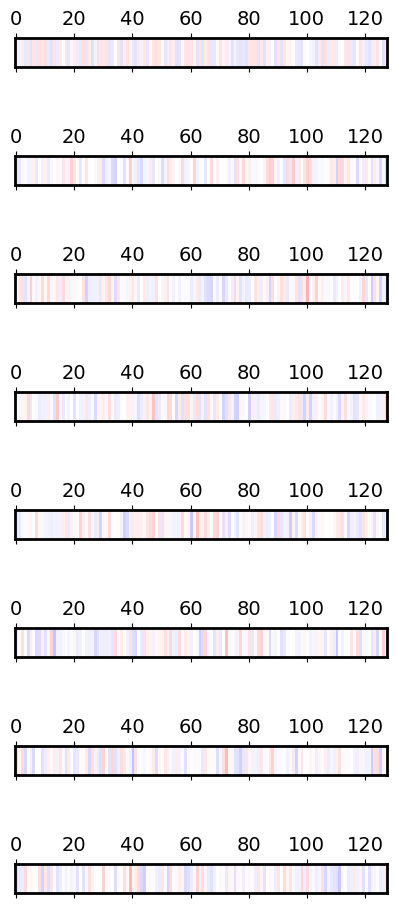

In [12]:
print(pc_activities.shape)
explained_variance_ratios = pca.explained_variance_ratio_
pca.components_

scale = 0.8
fig, axs = plt.subplots(8, 1, figsize=(6 * scale, 15 * scale))

for i in range(8):
    axs[i].matshow(pca.components_[i, :, np.newaxis].T, aspect=10, cmap='bwr', vmin=-1, vmax=1)
    axs[i].set_yticks([])



180
(128, 210, 20000)


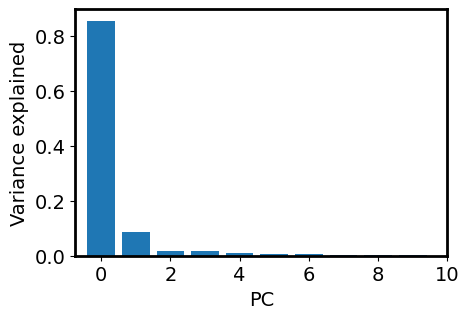

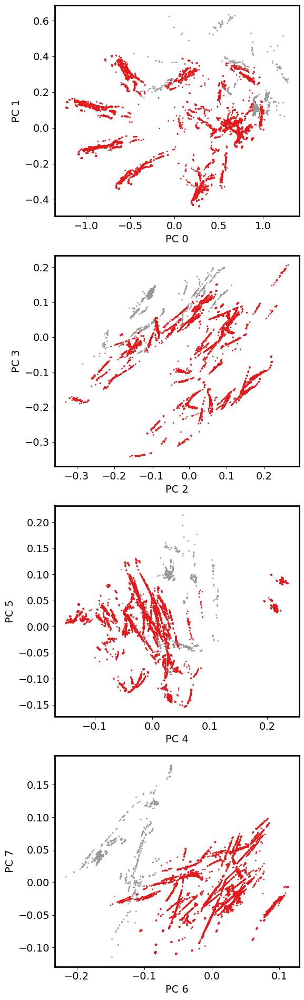

In [13]:
print(env_idx)

scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))

print(pc_activities.shape)

for k in np.arange(0, 8, 2):
    cbar = axs[int(k/2)].scatter(
        pc_activities[k, env_idx, :],
        pc_activities[k+1, env_idx, :],
        s=1,
        c=session_data['agent_in_patch'],
        cmap='Set1_r',
        # vmax=2,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    # fig.colorbar(cbar)
fig.tight_layout()

In [14]:
def create_colormap(colors, name):
    """
    Create a custom colormap.

    Parameters:
        colors (list): A list of colors as strings or RGB tuples.
        name (str): Name of the colormap.

    Returns:
        LinearSegmentedColormap: The custom colormap.
    """
    return LinearSegmentedColormap.from_list(name, colors)

def plot_colormap(colormap, title):
    """
    Plot a colormap for visualization.

    Parameters:
        colormap (LinearSegmentedColormap): The colormap to visualize.
        title (str): Title of the plot.
    """
    gradient = np.linspace(0, 1, 256).reshape(1, -1)
    plt.figure(figsize=(8, 1))
    plt.imshow(gradient, aspect='auto', cmap=colormap)
    plt.axis('off')
    plt.title(title, loc='center', pad=10)
    plt.show()

# Define colors for each colormap
red_colors = [(1, 0.6, 0.6), (0.4, 0, 0)]  # Dark red to light red
blue_colors = [(0.6, 0.6, 1), (0, 0, 0.4)]  # Dark blue to light blue
purple_colors = [(0.8, 0.2, 0.8), (0.2, 0, 0.2)]  # Dark purple to bright purple

# Create the colormaps
red_colormap = create_colormap(red_colors, "RedColormap")
blue_colormap = create_colormap(blue_colors, "BlueColormap")
purple_colormap = create_colormap(purple_colors, "PurpleColormap")

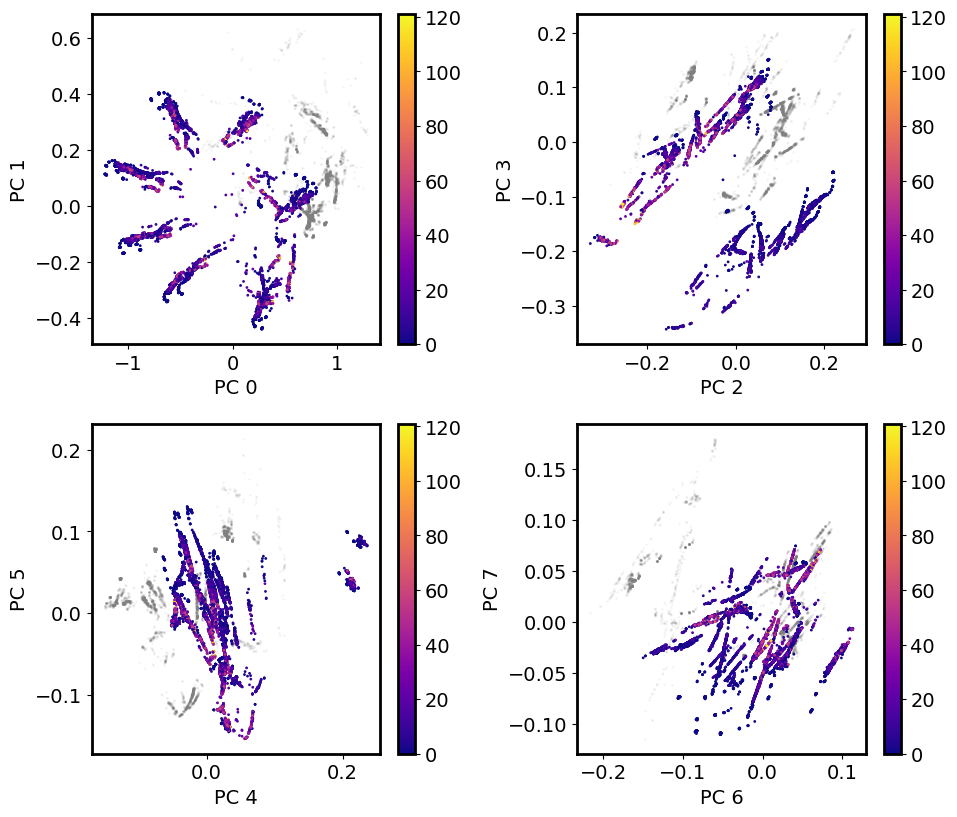

In [15]:
scale = 1.4
fig, axs = plt.subplots(2, 2, figsize=(7 * scale, 6 * scale)) # sharex=True, sharey=True)
colors = [
    red_colormap,
    blue_colormap,
    purple_colormap
]

maxes = [1, 10, 30]

for k in np.arange(0, 8, 2):
    all_mask_off = []
    k_x, k_y = int(k/4), int(k/2) % 2
    
    patch_nums = session_data['current_patch_num'].astype(int)
    mask_on = logical_and(
        session_data['reward_site_idx'] >= 0,
    )
    mask_off = ~mask_on
        
    cbar = axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][mask_on],
        pc_activities[k+1, env_idx, :][mask_on],
        s=1,
        cmap='plasma',
        c=session_data['reward_site_idx'][mask_on],
    )
    
    axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][mask_off],
        pc_activities[k+1, env_idx, :][mask_off],
        s=1,
        zorder=-1,
        c='grey',
        alpha=0.05,
    )
    
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    # axs[k_x, k_y].set_xlim(-1.5, 1.5)
    # axs[k_x, k_y].set_ylim(-1.5, 1.5)
    
    # axs[int(k/2)].set_aspect('equal')
# axs[0, 0].set_title('Activity colored by current patch odor')
    fig.colorbar(cbar)
fig.tight_layout()

[ 0. 10. 30.]


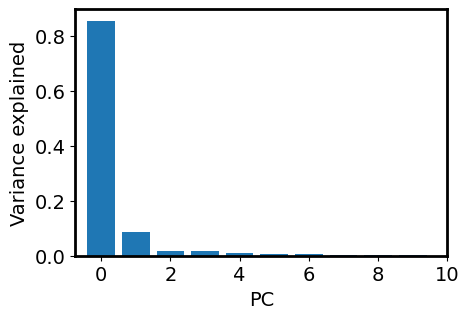

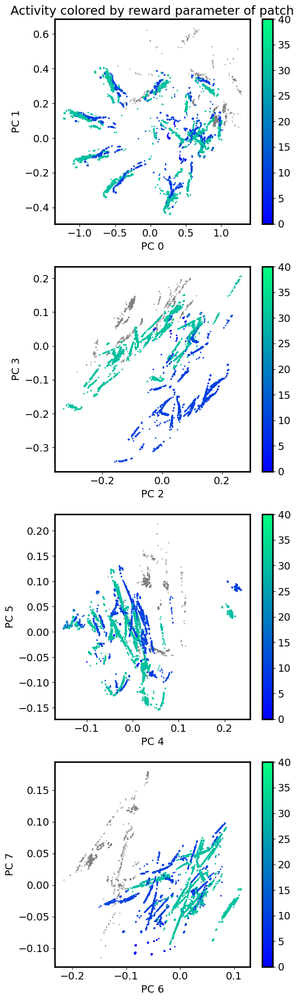

In [35]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))

print(np.unique(session_data['patch_reward_param'][session_data['agent_in_patch'] > 0]))


for k in np.arange(0, 8, 2):
    cbar = axs[int(k/2)].scatter(
        pc_activities[k, env_idx, :][session_data['agent_in_patch'] <= 0],
        pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] <= 0],
        s=1,
        c='grey',
        alpha=0.5,
        # vmax=2,
    )
    cbar = axs[int(k/2)].scatter(
        pc_activities[k, env_idx, :][session_data['agent_in_patch'] > 0],
        pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] > 0],
        s=1,
        c=session_data['patch_reward_param'][session_data['agent_in_patch'] > 0],
        cmap='winter',
        vmin=0,
        vmax=40
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
axs[0].set_title('Activity colored by reward parameter of patch')
fig.tight_layout()


(20000,)
(20000,)
(20000,)
(20000,)


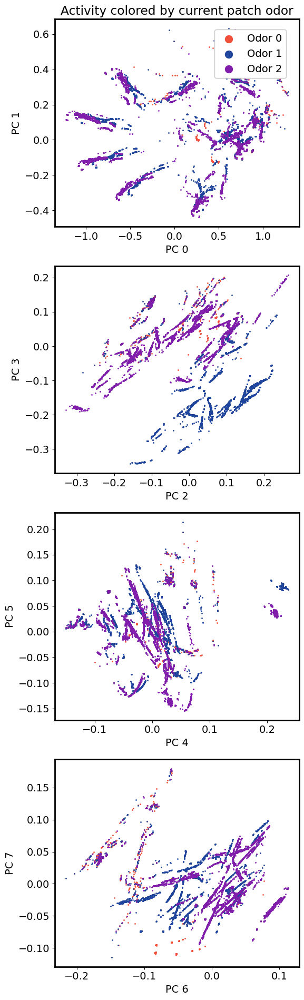

In [36]:
scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))
colors = ['#F05039', '#1F449C', '#801dab']

for k in np.arange(0, 8, 2):
    all_mask_off = []
    for i in range(3):
        patch_nums = session_data['current_patch_num'].astype(int)
        mask_on = patch_nums == i
        mask_off = ~mask_on
        all_mask_off.append(mask_off)

        if k == 0:
            axs[int(k/2)].scatter(
                pc_activities[k, env_idx, :][mask_on],
                pc_activities[k+1, env_idx, :][mask_on],
                s=1,
                color=colors[i],
                label=f'Odor {i}'
            )
        else:
            axs[int(k/2)].scatter(
                pc_activities[k, env_idx, :][mask_on],
                pc_activities[k+1, env_idx, :][mask_on],
                s=1,
                color=colors[i],
            )
    all_mask_off = np.stack(all_mask_off).sum(axis=0).astype(bool)
    print(all_mask_off.shape)
    
    axs[int(k/2)].scatter(
        pc_activities[k, env_idx, :][all_mask_off],
        pc_activities[k+1, env_idx, :][all_mask_off],
        s=1,
        zorder=-1,
        c='grey',
        alpha=0.05,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    axs[0].set_title('Activity colored by current patch odor')
    fig.legend(markerscale=10, bbox_to_anchor=(0.94, 0.97))
fig.tight_layout()


(20000,)
(20000,)
(20000,)
(20000,)


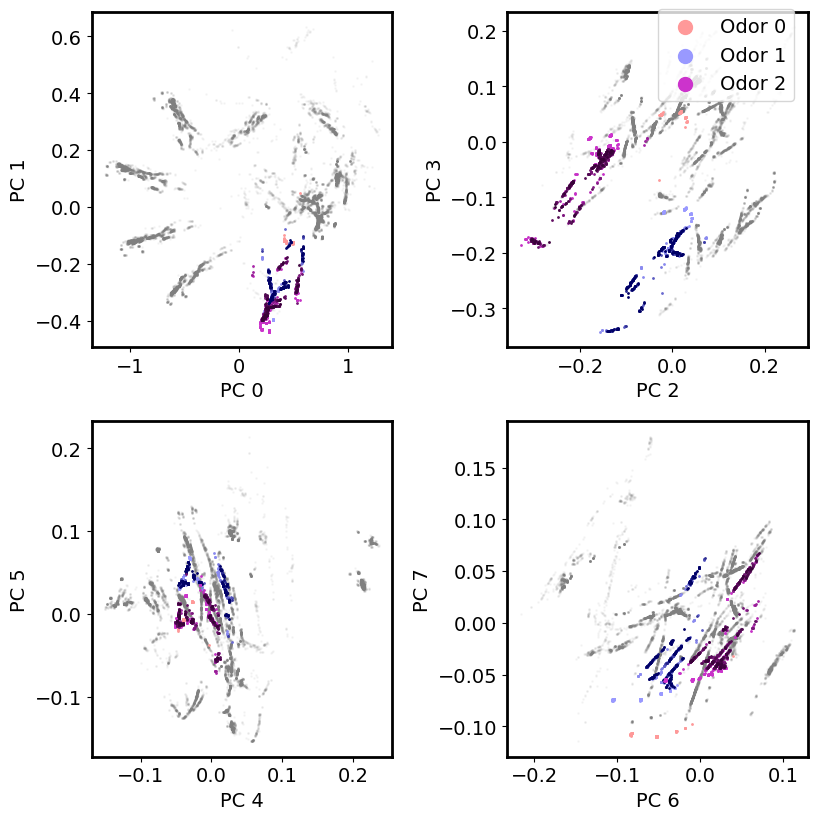

In [16]:
scale = 1.2
fig, axs = plt.subplots(2, 2, figsize=(7 * scale, 7 * scale))
colors = [
    red_colormap,
    blue_colormap,
    purple_colormap
]

maxes = [1, 10, 30]


n = 0

for k in np.arange(0, 8, 2):
    all_mask_off = []
    k_x, k_y = int(k/4), int(k/2) % 2
    
    for i in range(3):
        for j in range(30):
            patch_nums = session_data['current_patch_num'].astype(int)
            mask_on = logical_and(
                patch_nums == i,
                session_data['agent_in_patch'] > 0,
                np.roll(session_data['reward_site_idx'], n) == j,
                np.roll(session_data['reward_site_idx'], n + 1) == -1,
                session_data['rewards_seen_in_patch'] >= 0,
            )
            mask_off = ~mask_on
            all_mask_off.append(mask_off)
            
            if k == 0 and j == 0:
                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    color=colors[i](j/maxes[i]),
                    label=f'Odor {i}'
                )
            else:
                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    color=colors[i](j/maxes[i]),
                )
    all_mask_off = np.stack(all_mask_off).sum(axis=0).astype(bool)
    print(all_mask_off.shape)
    
    axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][all_mask_off],
        pc_activities[k+1, env_idx, :][all_mask_off],
        s=1,
        zorder=-1,
        c='grey',
        alpha=0.05,
    )
    
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    # axs[int(k/2)].set_aspect('equal')
# axs[0, 0].set_title('Activity colored by current patch odor')
fig.legend(markerscale=10, bbox_to_anchor=(0.97, 0.99))
fig.tight_layout()

(20000,)
(20000,)
(20000,)
(20000,)


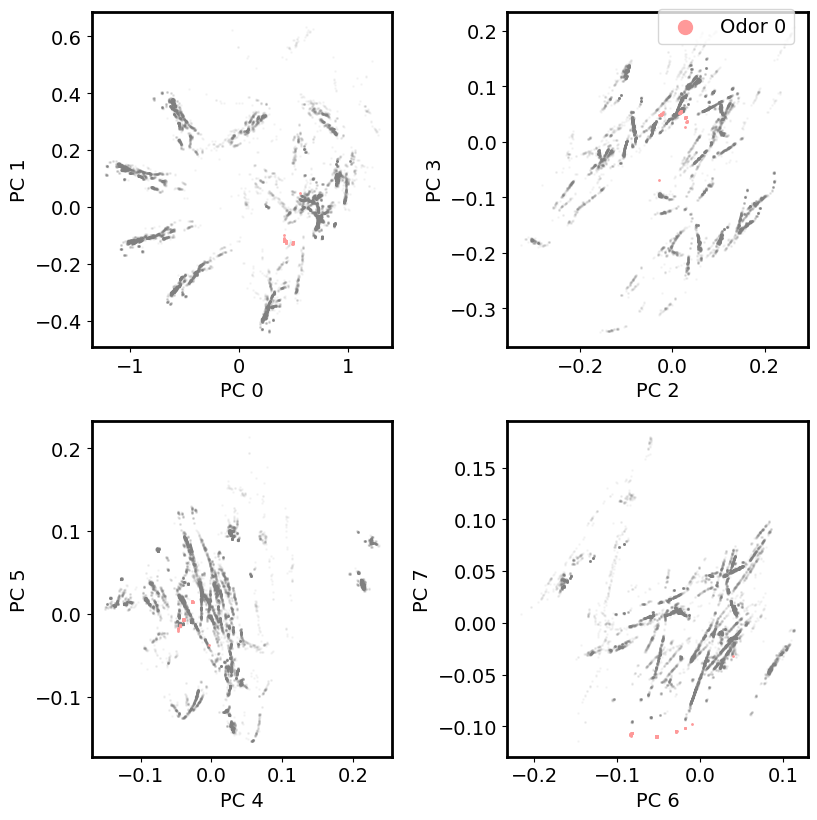

In [17]:
scale = 1.2
fig, axs = plt.subplots(2, 2, figsize=(7 * scale, 7 * scale))
colors = [
    red_colormap,
    blue_colormap,
    purple_colormap
]

maxes = [1, 10, 30]


n = 0

for k in np.arange(0, 8, 2):
    all_mask_off = []
    k_x, k_y = int(k/4), int(k/2) % 2
    
    for i in range(0, 1):
        for j in range(30):
            patch_nums = session_data['current_patch_num'].astype(int)
            mask_on = logical_and(
                patch_nums == i,
                session_data['agent_in_patch'] > 0,
                np.roll(session_data['reward_site_idx'], n) == j,
                np.roll(session_data['reward_site_idx'], n + 1) == -1,
                session_data['rewards_seen_in_patch'] >= 0,
            )
            mask_off = ~mask_on
            all_mask_off.append(mask_off)
            
            if k == 0 and j == 0:
                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    color=colors[i](j/maxes[i]),
                    label=f'Odor {i}'
                )
            else:
                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    color=colors[i](j/maxes[i]),
                )
    all_mask_off = np.stack(all_mask_off).sum(axis=0).astype(bool)
    print(all_mask_off.shape)
    
    axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][all_mask_off],
        pc_activities[k+1, env_idx, :][all_mask_off],
        s=1,
        zorder=-1,
        c='grey',
        alpha=0.05,
    )
    
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    # axs[int(k/2)].set_aspect('equal')
fig.legend(markerscale=10, bbox_to_anchor=(0.97, 0.99))
fig.tight_layout()

(20000,)
(20000,)
(20000,)
(20000,)


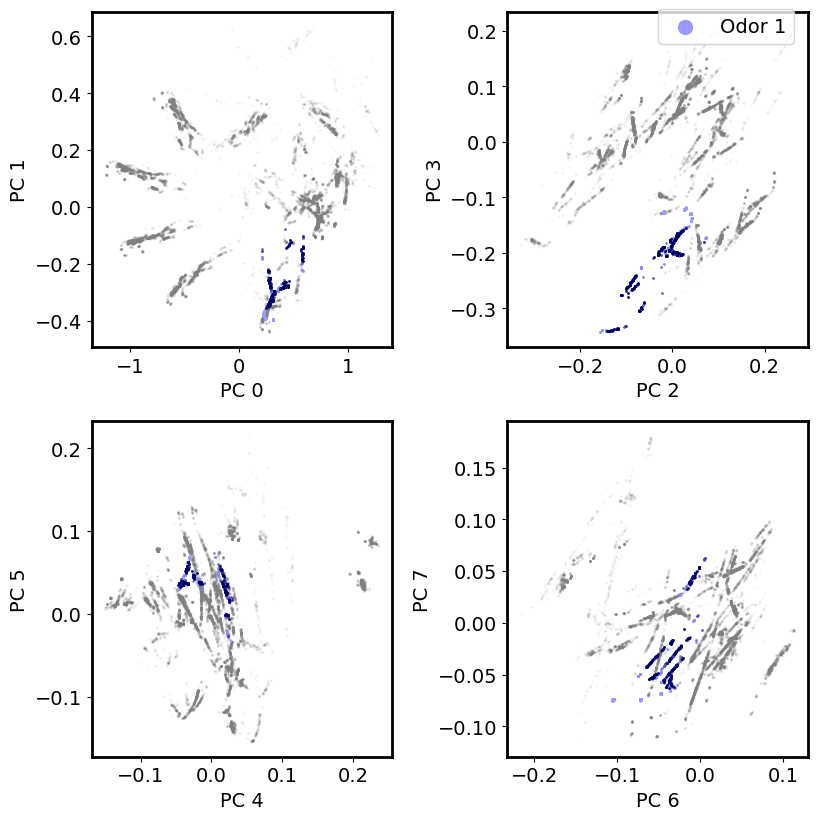

In [18]:
scale = 1.2
fig, axs = plt.subplots(2, 2, figsize=(7 * scale, 7 * scale))
colors = [
    red_colormap,
    blue_colormap,
    purple_colormap
]

maxes = [1, 10, 30]

n = 0

for k in np.arange(0, 8, 2):
    all_mask_off = []
    k_x, k_y = int(k/4), int(k/2) % 2
    
    for i in range(1, 2):
        for j in range(30):
            patch_nums = session_data['current_patch_num'].astype(int)
            mask_on = logical_and(
                patch_nums == i,
                session_data['agent_in_patch'] > 0,
                np.roll(session_data['reward_site_idx'], n) == j,
                np.roll(session_data['reward_site_idx'], n + 1) == -1,
                session_data['rewards_seen_in_patch'] >= 0,
            )
            mask_off = ~mask_on
            all_mask_off.append(mask_off)
            
            if k == 0 and j == 0:
                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    color=colors[i](j/maxes[i]),
                    label=f'Odor {i}'
                )
            else:
                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    color=colors[i](j/maxes[i]),
                )
    all_mask_off = np.stack(all_mask_off).sum(axis=0).astype(bool)
    print(all_mask_off.shape)
    
    axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][all_mask_off],
        pc_activities[k+1, env_idx, :][all_mask_off],
        s=1,
        zorder=-1,
        c='grey',
        alpha=0.05,
    )
    
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    # axs[int(k/2)].set_aspect('equal')
fig.legend(markerscale=10, bbox_to_anchor=(0.97, 0.99))
fig.tight_layout()

(20000,)
(20000,)
(20000,)
(20000,)


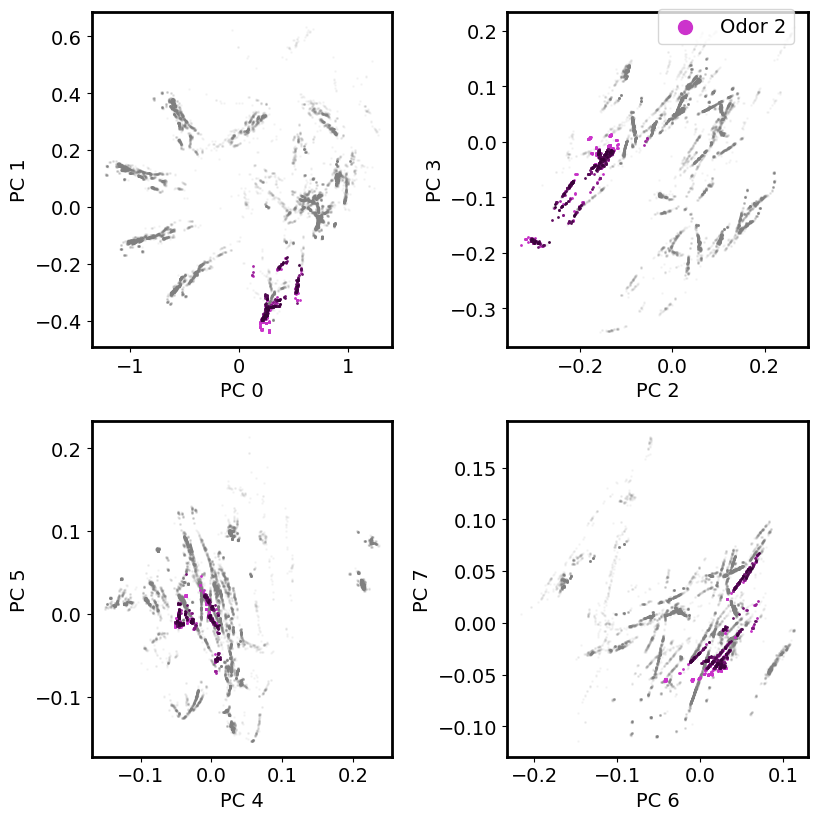

In [43]:
scale = 1.2
fig, axs = plt.subplots(2, 2, figsize=(7 * scale, 7 * scale))
colors = [
    red_colormap,
    blue_colormap,
    purple_colormap
]

maxes = [1, 10, 30]


n = 0

for k in np.arange(0, 8, 2):
    all_mask_off = []
    k_x, k_y = int(k/4), int(k/2) % 2
    
    for i in range(2, 3):
        for j in range(30):
            patch_nums = session_data['current_patch_num'].astype(int)
            mask_on = logical_and(
                patch_nums == i,
                session_data['agent_in_patch'] > 0,
                np.roll(session_data['reward_site_idx'], n) == j,
                np.roll(session_data['reward_site_idx'], n + 1) == -1,
                session_data['rewards_seen_in_patch'] >= 0,
            )
            mask_off = ~mask_on
            all_mask_off.append(mask_off)
            
            if k == 0 and j == 0:
                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    color=colors[i](j/maxes[i]),
                    label=f'Odor {i}'
                )
            else:
                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    color=colors[i](j/maxes[i]),
                )
    all_mask_off = np.stack(all_mask_off).sum(axis=0).astype(bool)
    print(all_mask_off.shape)
    
    axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][all_mask_off],
        pc_activities[k+1, env_idx, :][all_mask_off],
        s=1,
        zorder=-1,
        c='grey',
        alpha=0.05,
    )
    
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    # axs[int(k/2)].set_aspect('equal')
fig.legend(markerscale=10, bbox_to_anchor=(0.97, 0.99))
fig.tight_layout()

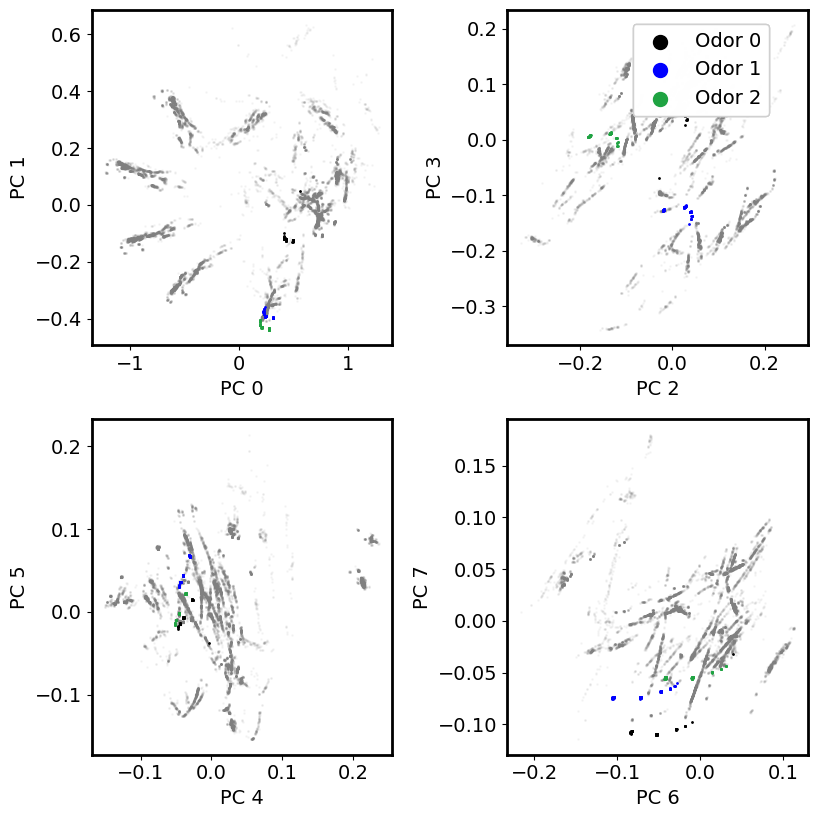

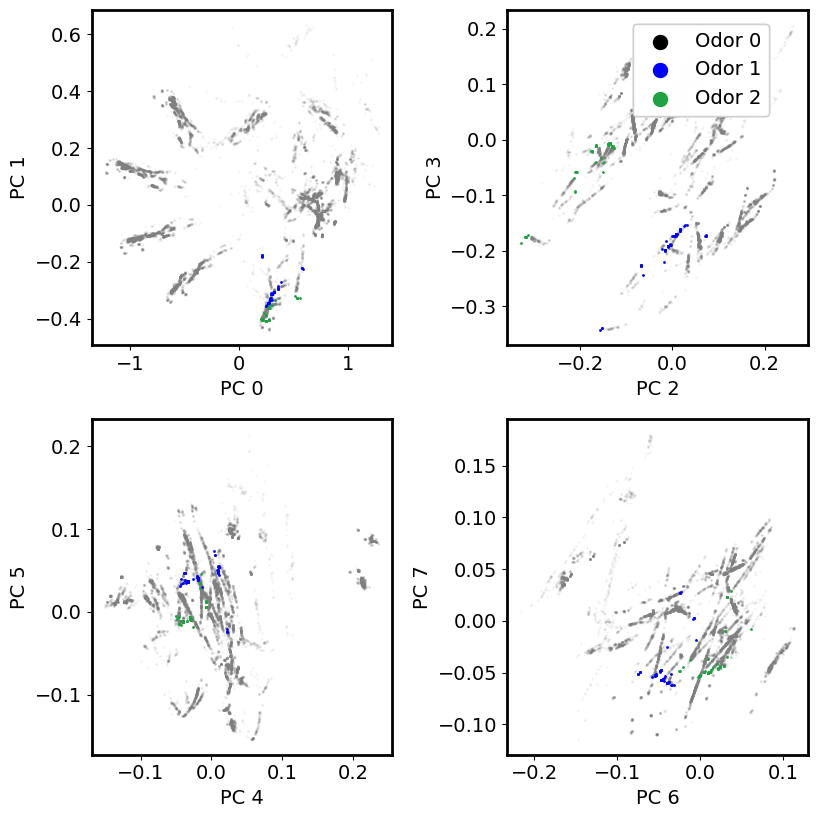

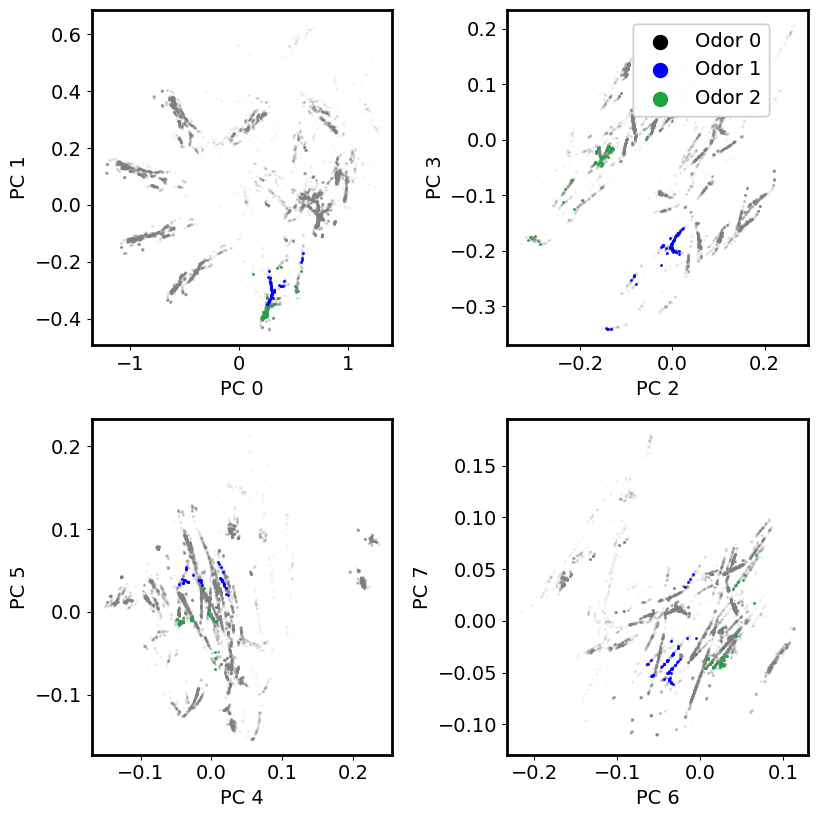

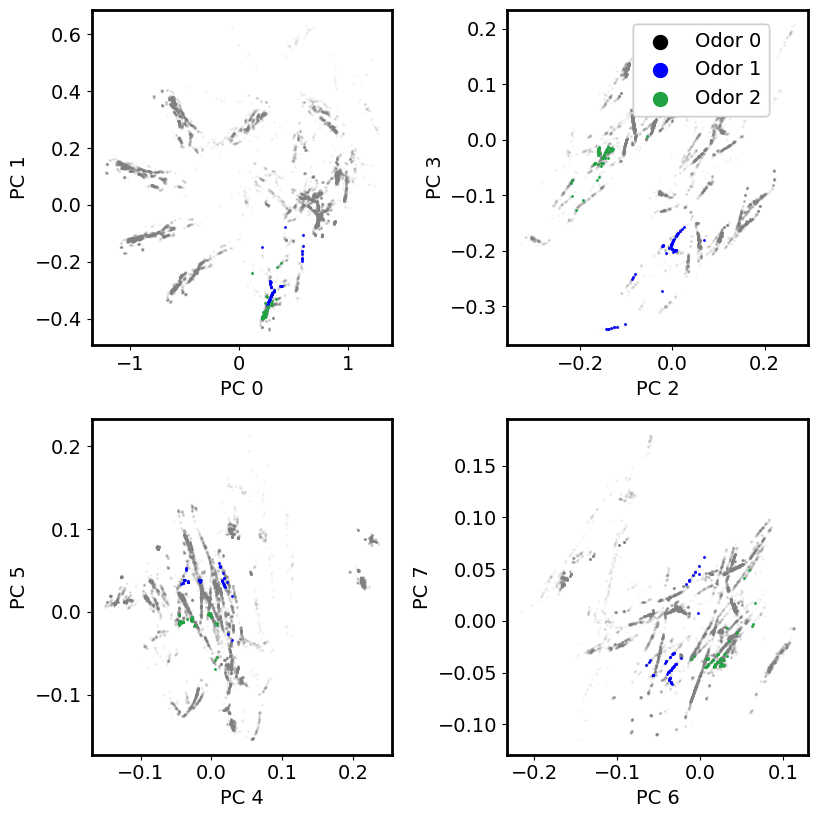

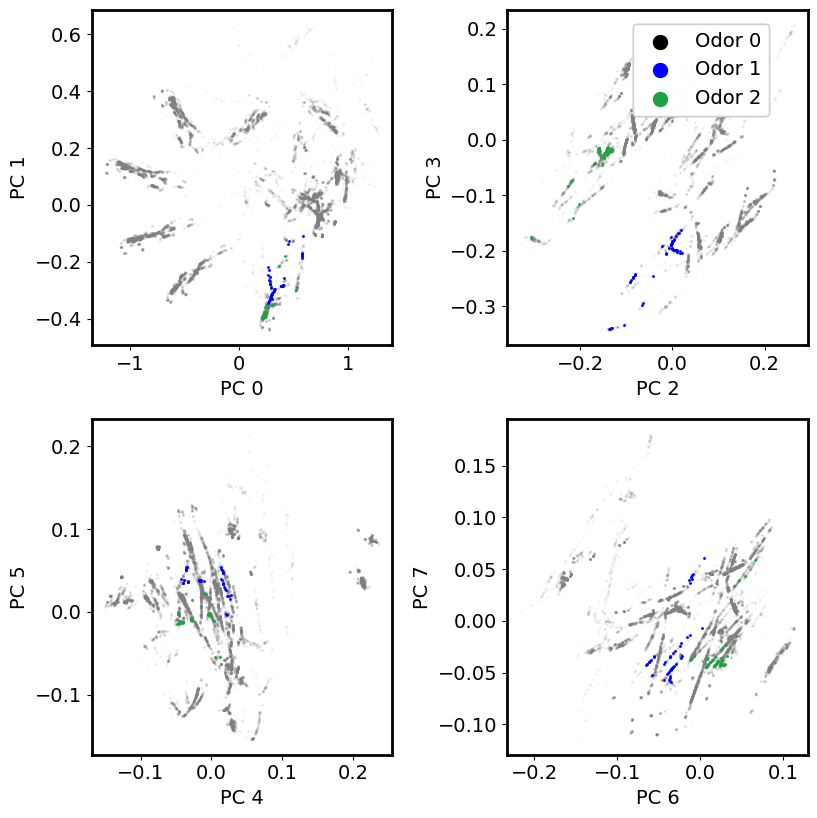

...

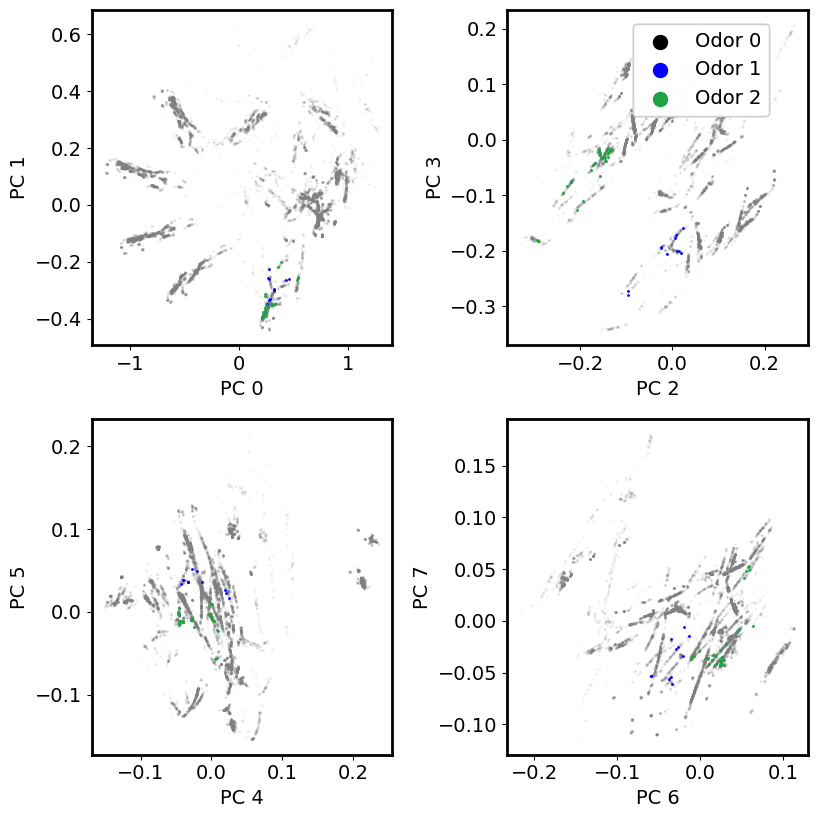

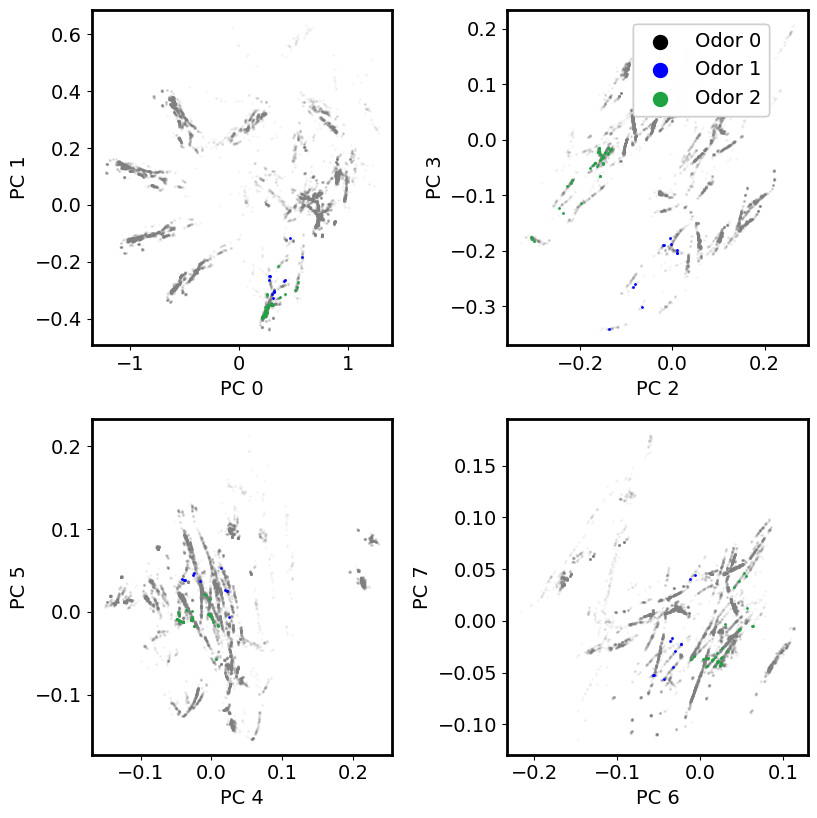

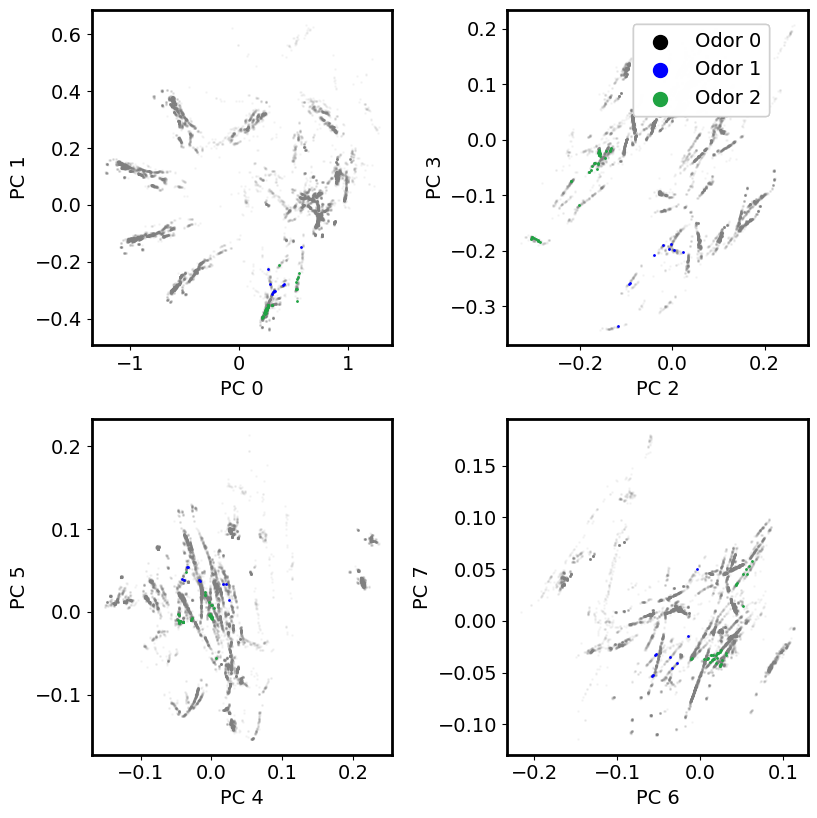

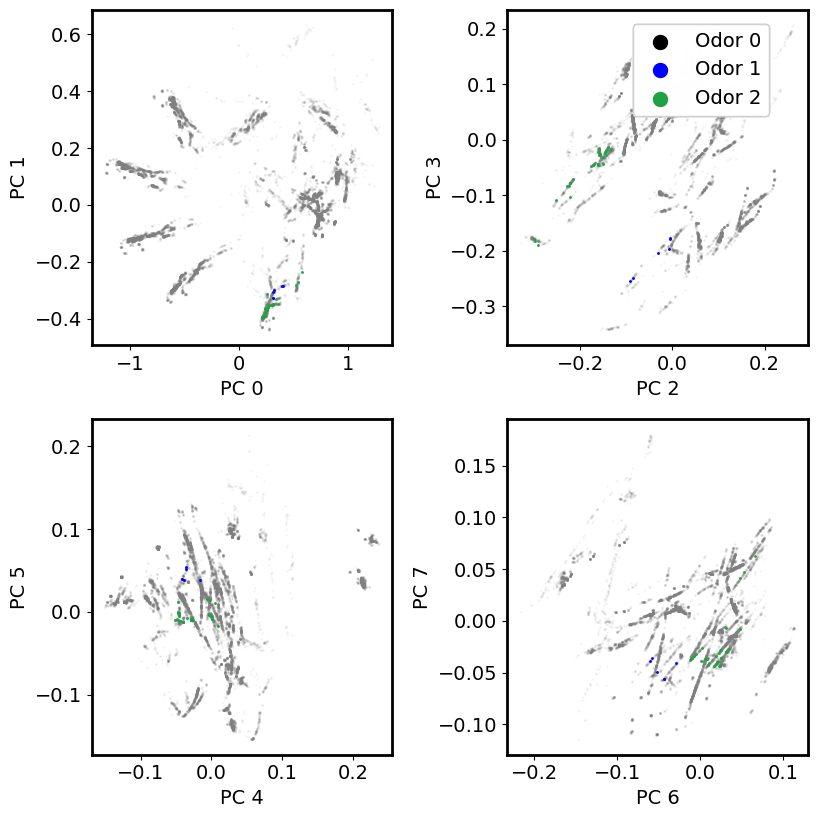

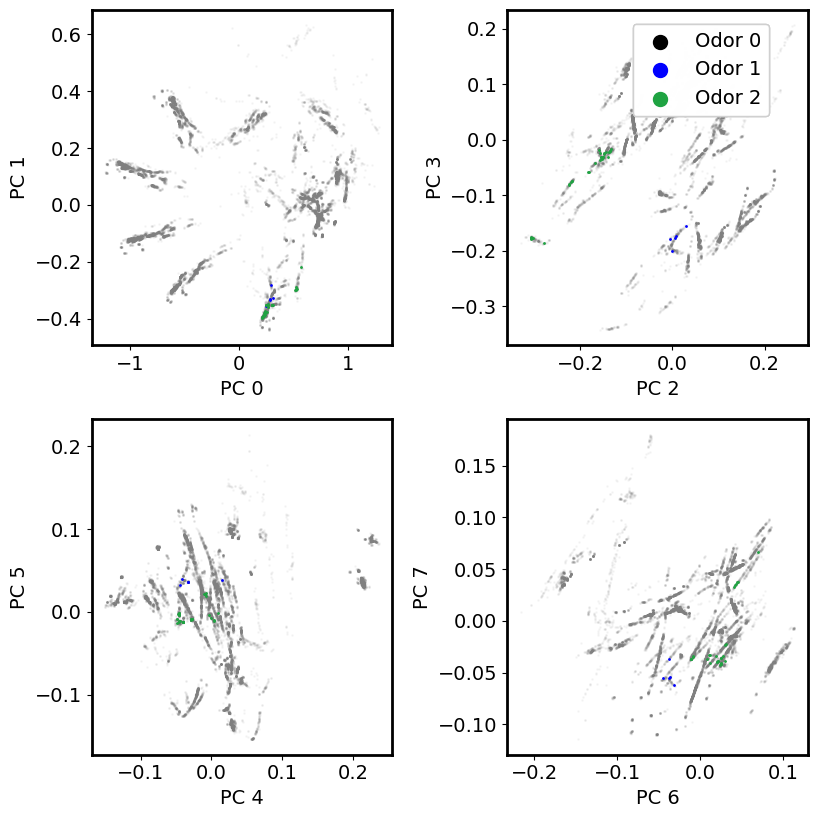

In [44]:
scale = 1.2
colors = ['black', 'blue', '#1fa342']
n = 0

for reward_site_idx in range(20):
    fig, axs = plt.subplots(2, 2, figsize=(7 * scale, 7 * scale))
    for k in np.arange(0, 8, 2):
        k_x, k_y = int(k/4), int(k/2) % 2
        all_mask_off = []
        for i in range(3):
            patch_nums = session_data['current_patch_num'].astype(int)
            mask_on = logical_and(
                patch_nums == i,
                session_data['agent_in_patch'] > 0,
                np.roll(session_data['reward_site_idx'], n) == reward_site_idx,
                np.roll(session_data['reward_site_idx'], n + 1) == -1,
            )
            mask_off = ~mask_on
            all_mask_off.append(mask_off)
            
            if k == 0:
                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    color=colors[i],
                    label=f'Odor {i}'
                )
            else:
                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    color=colors[i],
                )
        all_mask_off = np.stack(all_mask_off).sum(axis=0).astype(bool)
        
        axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][all_mask_off],
            pc_activities[k+1, env_idx, :][all_mask_off],
            s=1,
            zorder=-1,
            c='grey',
            alpha=0.05,
        )
        axs[k_x, k_y].set_xlabel(f'PC {k}')
        axs[k_x, k_y].set_ylabel(f'PC {k+1}')
        fig.legend(markerscale=10, bbox_to_anchor=(0.94, 0.97))
    fig.tight_layout()

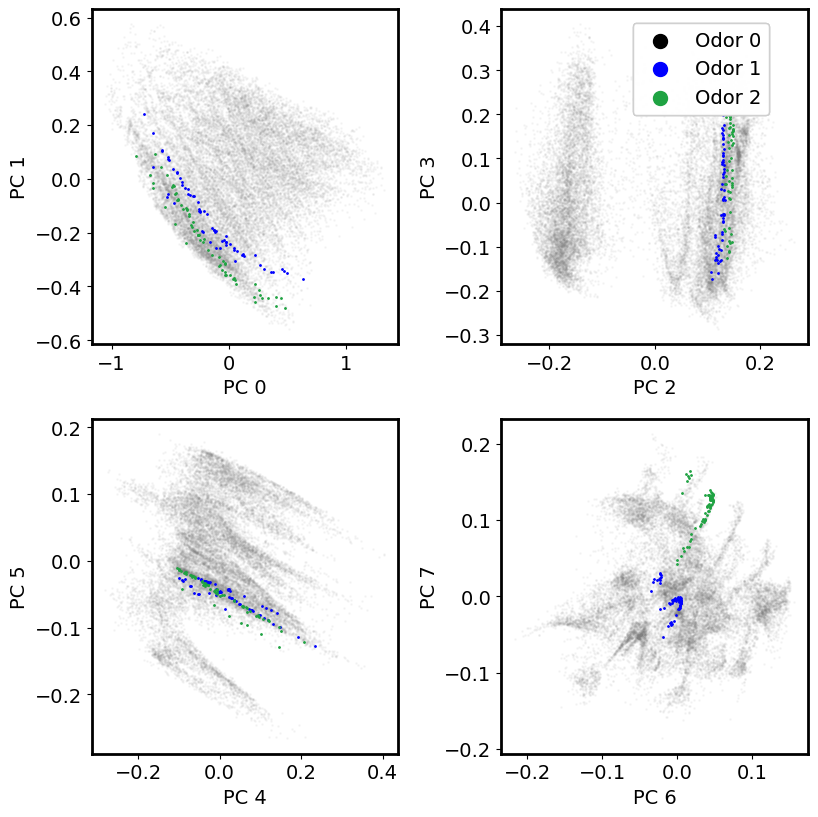

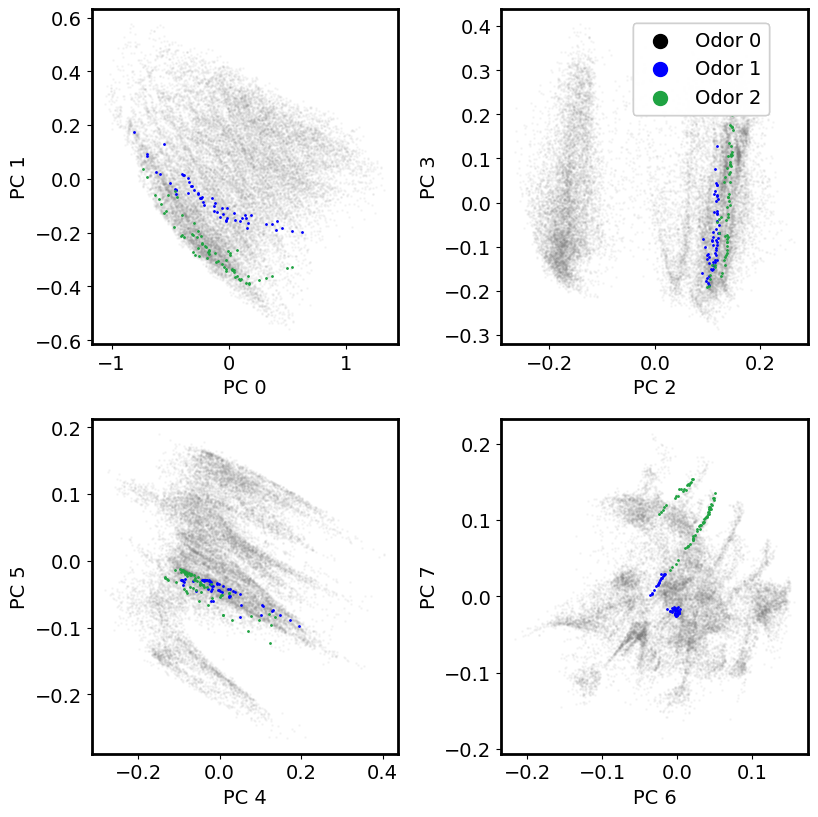

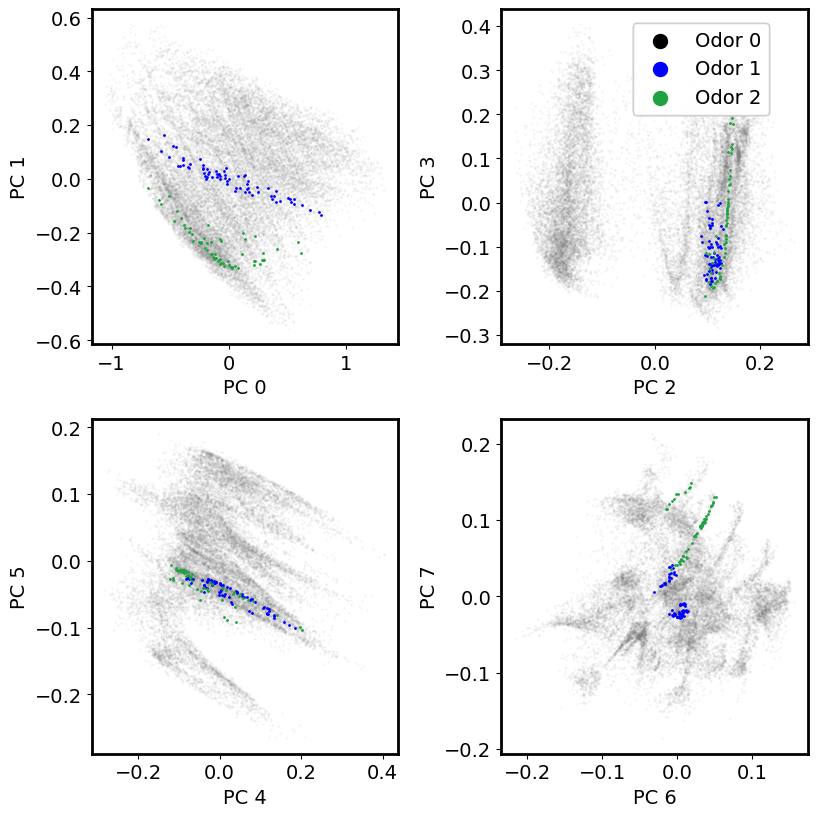

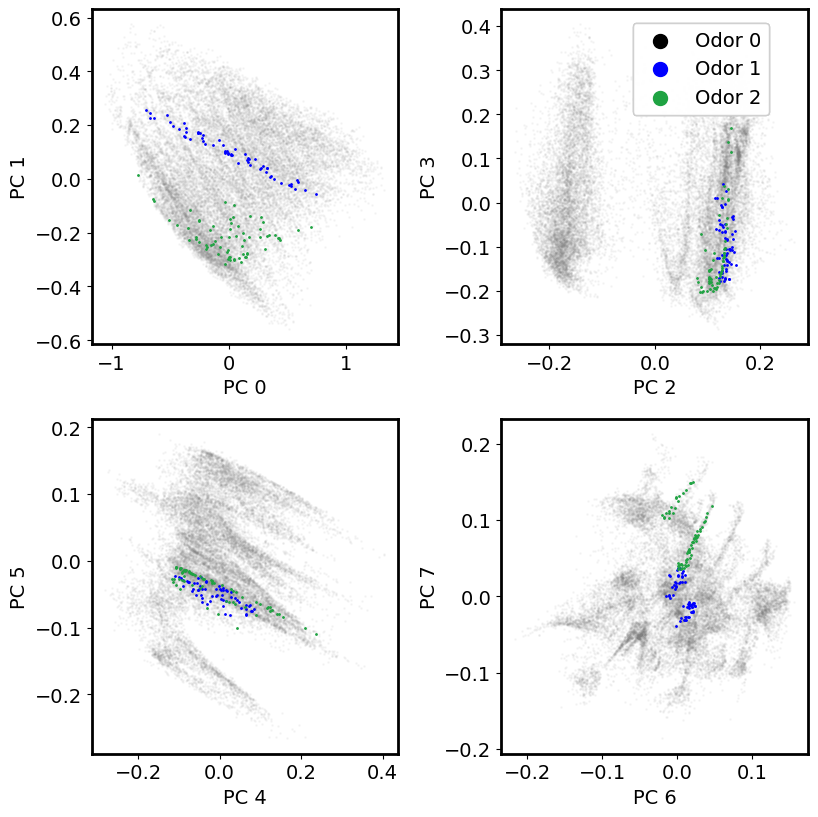

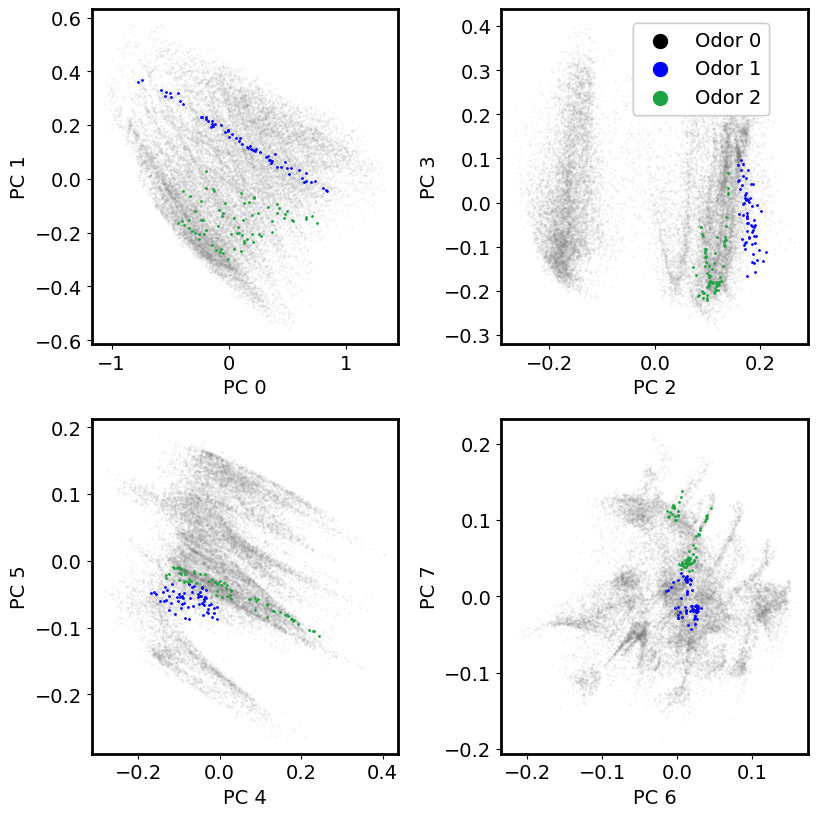

...

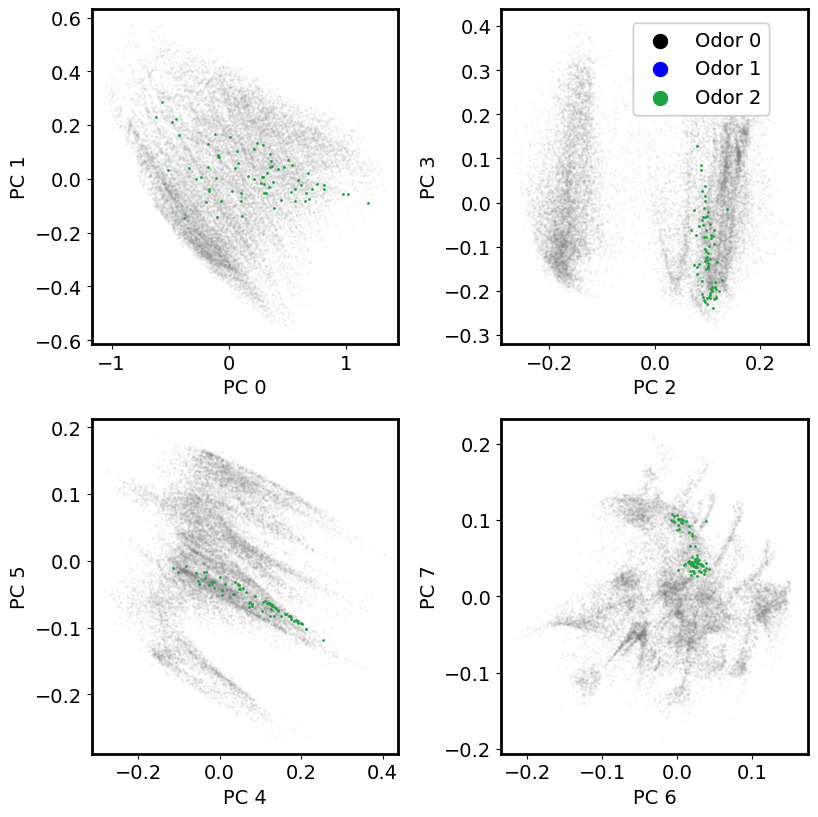

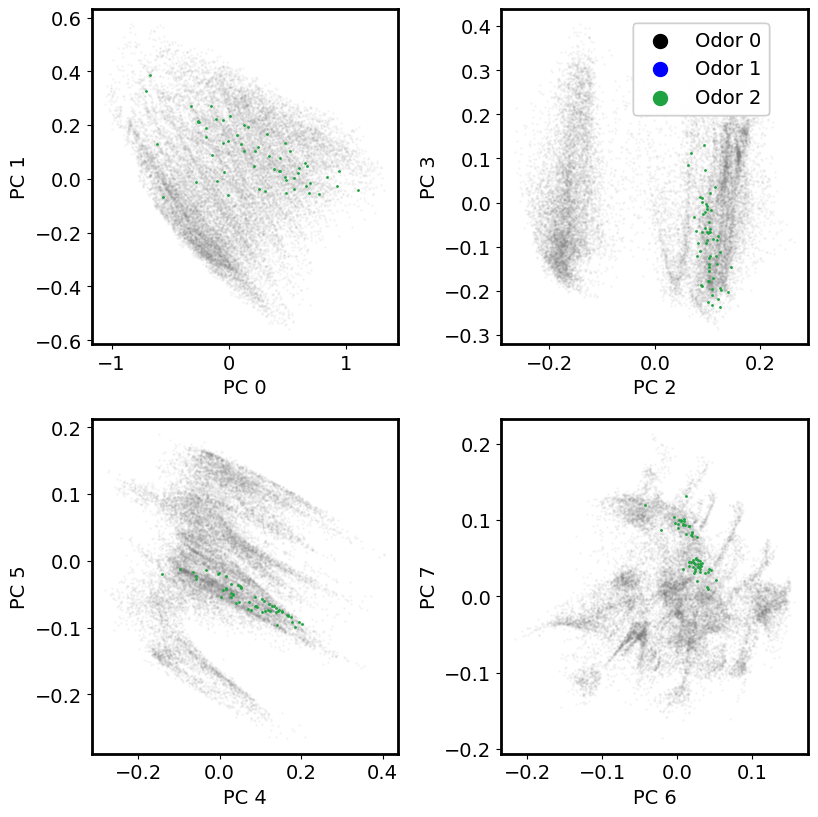

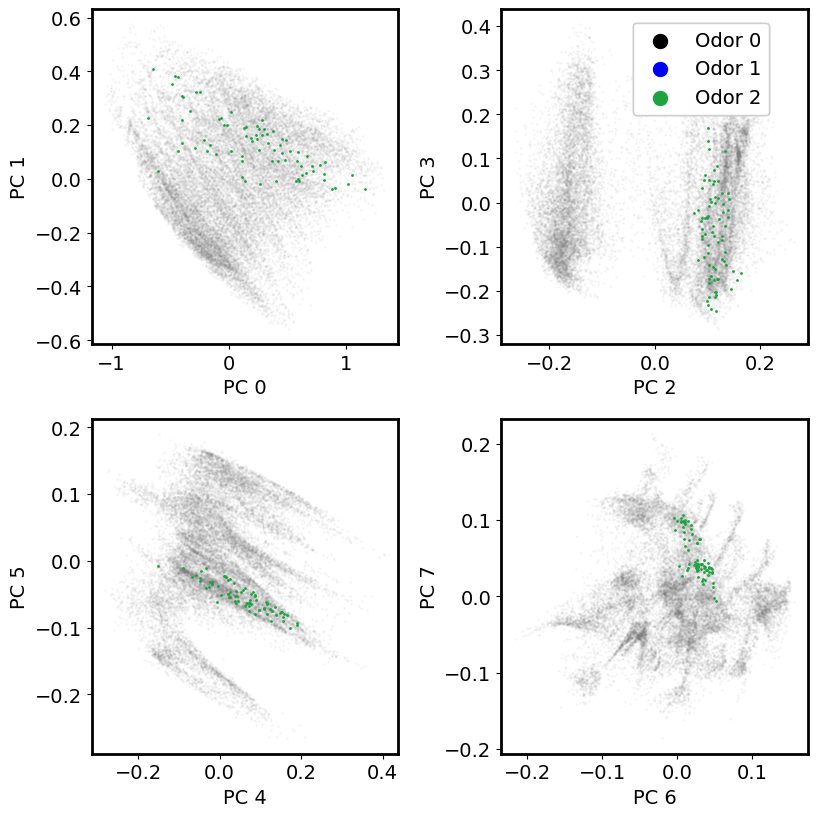

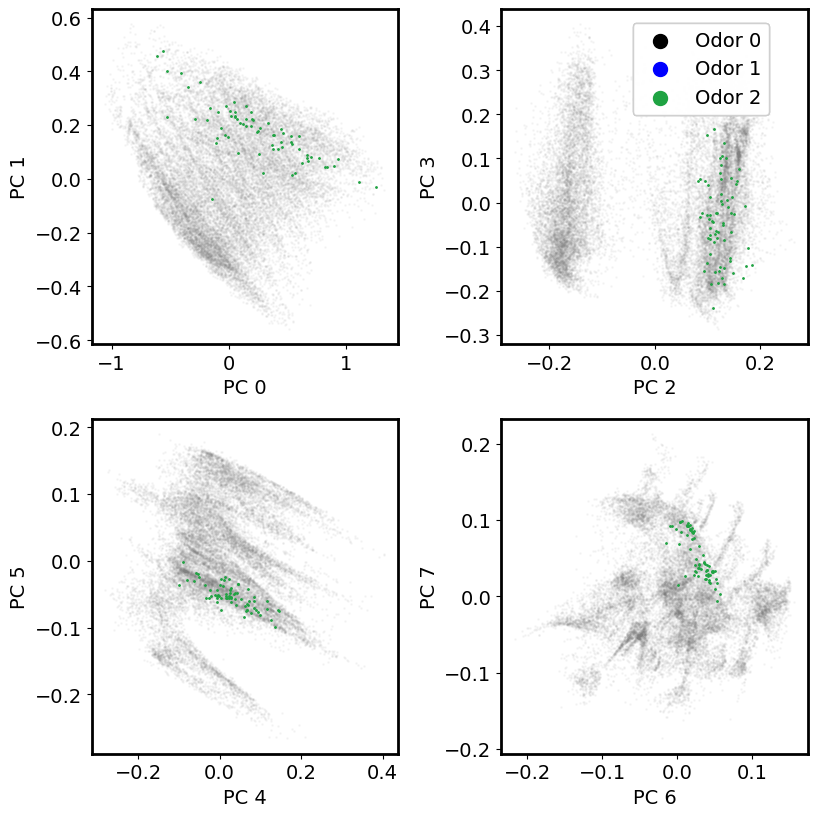

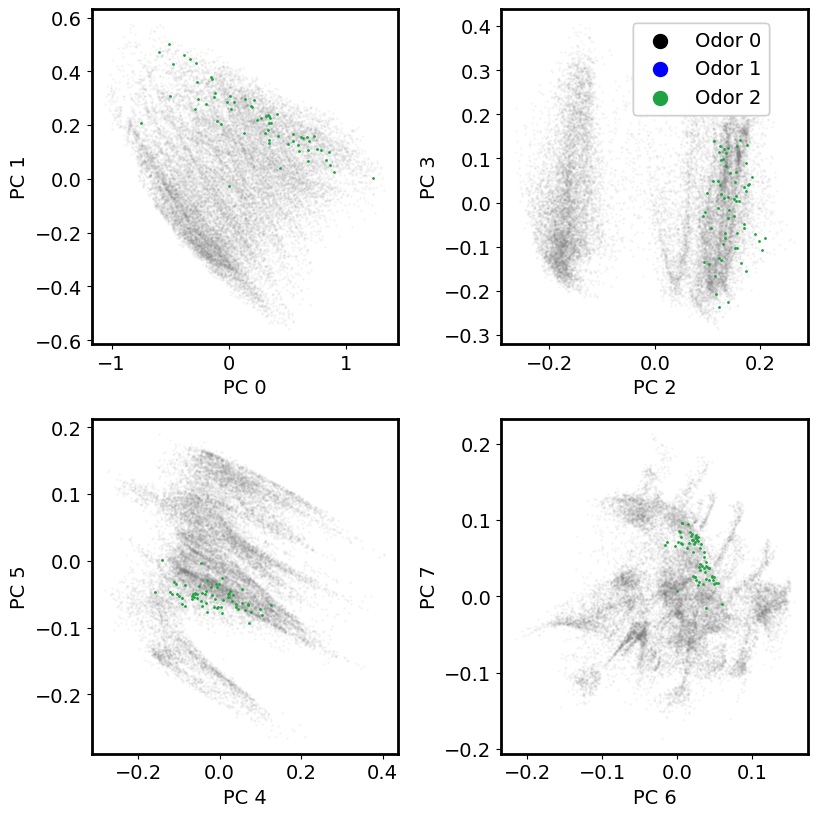

In [23]:
scale = 1.2
colors = ['black', 'blue', '#1fa342']
n = 1

for reward_site_idx in range(12):
    fig, axs = plt.subplots(2, 2, figsize=(7 * scale, 7 * scale))
    for k in np.arange(0, 8, 2):
        k_x, k_y = int(k/4), int(k/2) % 2
        all_mask_off = []
        for i in range(3):
            patch_nums = session_data['current_patch_num'].astype(int)
            mask_on = logical_and(
                patch_nums == i,
                session_data['agent_in_patch'] > 0,
                np.roll(session_data['reward_site_idx'], n + 1) == reward_site_idx,
                np.roll(session_data['reward_site_idx'], n) == -1,
                session_data['reward_site_idx'] == -1,
            )
            mask_off = ~mask_on
            all_mask_off.append(mask_off)
            
            if k == 0:
                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    color=colors[i],
                    label=f'Odor {i}'
                )
            else:
                axs[k_x, k_y].scatter(
                    pc_activities[k, env_idx, :][mask_on],
                    pc_activities[k+1, env_idx, :][mask_on],
                    s=1,
                    color=colors[i],
                )
        all_mask_off = np.stack(all_mask_off).sum(axis=0).astype(bool)
        
        axs[k_x, k_y].scatter(
            pc_activities[k, env_idx, :][all_mask_off],
            pc_activities[k+1, env_idx, :][all_mask_off],
            s=1,
            zorder=-1,
            c='grey',
            alpha=0.05,
        )
        axs[k_x, k_y].set_xlabel(f'PC {k}')
        axs[k_x, k_y].set_ylabel(f'PC {k+1}')
        fig.legend(markerscale=10, bbox_to_anchor=(0.94, 0.97))
    fig.tight_layout()

## N steps since agent entered patch

(20000,)
(20000,)
(20000,)
(20000,)


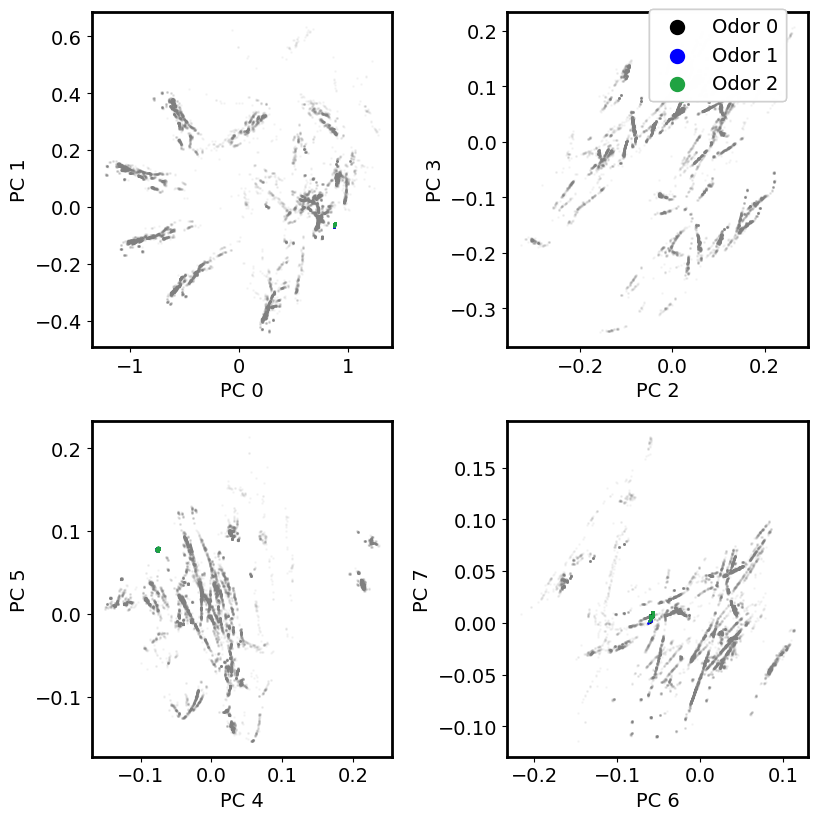

In [39]:
scale = 1.2
fig, axs = plt.subplots(2, 2, figsize=(7 * scale, 7 * scale))
colors = ['black', 'blue', '#1fa342']

n = 0

for k in np.arange(0, 8, 2):
    k_x, k_y = int(k/4), int(k/2) % 2
    all_mask_off = []
    for i in range(3):
        patch_nums = session_data['current_patch_num'].astype(int)
        mask_on = logical_and(
            patch_nums == i,
            session_data['agent_in_patch'] > 0,
            np.roll(session_data['agent_in_patch'], n) > 0,
            np.roll(session_data['agent_in_patch'], n + 1) == 0,
        )
        mask_off = ~mask_on
        all_mask_off.append(mask_off)
        
        if k == 0:
            axs[k_x, k_y].scatter(
                pc_activities[k, env_idx, :][mask_on],
                pc_activities[k+1, env_idx, :][mask_on],
                s=1,
                color=colors[i],
                label=f'Odor {i}'
            )
        else:
            axs[k_x, k_y].scatter(
                pc_activities[k, env_idx, :][mask_on],
                pc_activities[k+1, env_idx, :][mask_on],
                s=1,
                color=colors[i],
            )
    all_mask_off = np.stack(all_mask_off).sum(axis=0).astype(bool)
    print(all_mask_off.shape)
    
    axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][all_mask_off],
        pc_activities[k+1, env_idx, :][all_mask_off],
        s=1,
        zorder=-1,
        c='grey',
        alpha=0.05,
    )
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    fig.legend(markerscale=10, bbox_to_anchor=(0.96, 0.99))
fig.tight_layout()

## Agent will leave patch in N steps

(20000,)
(20000,)
(20000,)
(20000,)


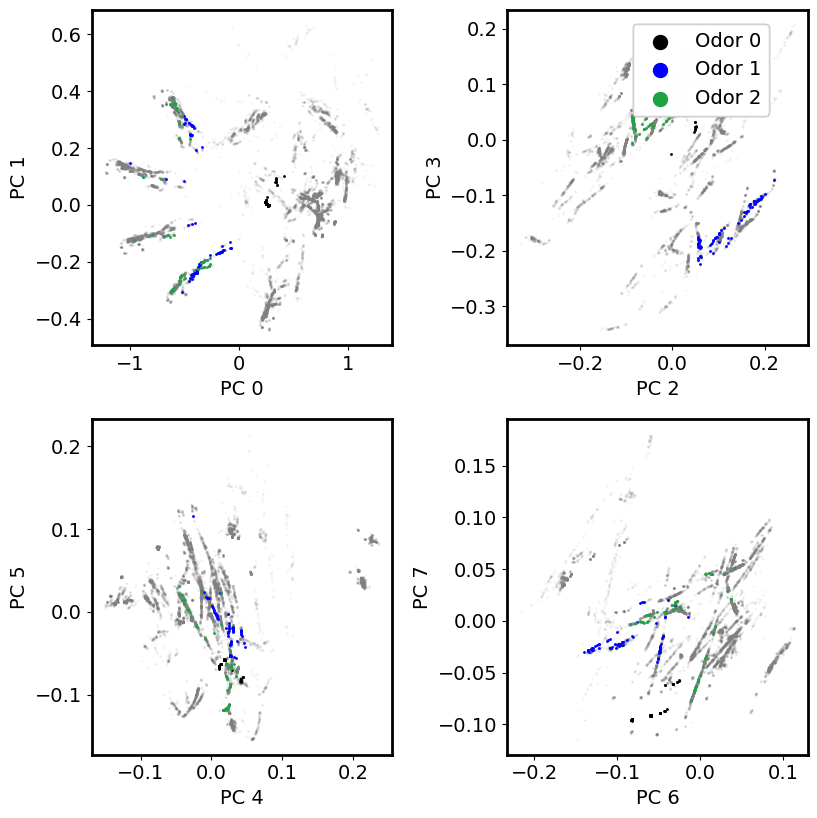

In [38]:
scale = 1.2
fig, axs = plt.subplots(2, 2, figsize=(7 * scale, 7 * scale))
colors = ['black', 'blue', '#1fa342']

n = 0
reward_site_idx = 0

for k in np.arange(0, 8, 2):
    k_x, k_y = int(k/4), int(k/2) % 2
    all_mask_off = []
    for i in range(3):
        patch_nums = session_data['current_patch_num'].astype(int)
        mask_on = logical_and(
            patch_nums == i,
            session_data['agent_in_patch'] > 0,
            np.roll(session_data['agent_in_patch'], -1) == 0,
        )
        mask_off = ~mask_on
        all_mask_off.append(mask_off)
        
        if k == 0:
            axs[k_x, k_y].scatter(
                pc_activities[k, env_idx, :][mask_on],
                pc_activities[k+1, env_idx, :][mask_on],
                s=1,
                color=colors[i],
                label=f'Odor {i}'
            )
        else:
            axs[k_x, k_y].scatter(
                pc_activities[k, env_idx, :][mask_on],
                pc_activities[k+1, env_idx, :][mask_on],
                s=1,
                color=colors[i],
            )
    all_mask_off = np.stack(all_mask_off).sum(axis=0).astype(bool)
    print(all_mask_off.shape)
    
    axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][all_mask_off],
        pc_activities[k+1, env_idx, :][all_mask_off],
        s=1,
        zorder=-1,
        c='grey',
        alpha=0.05,
    )
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    fig.legend(markerscale=10, bbox_to_anchor=(0.94, 0.97))
fig.tight_layout()

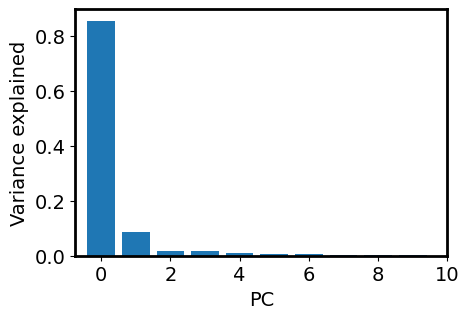

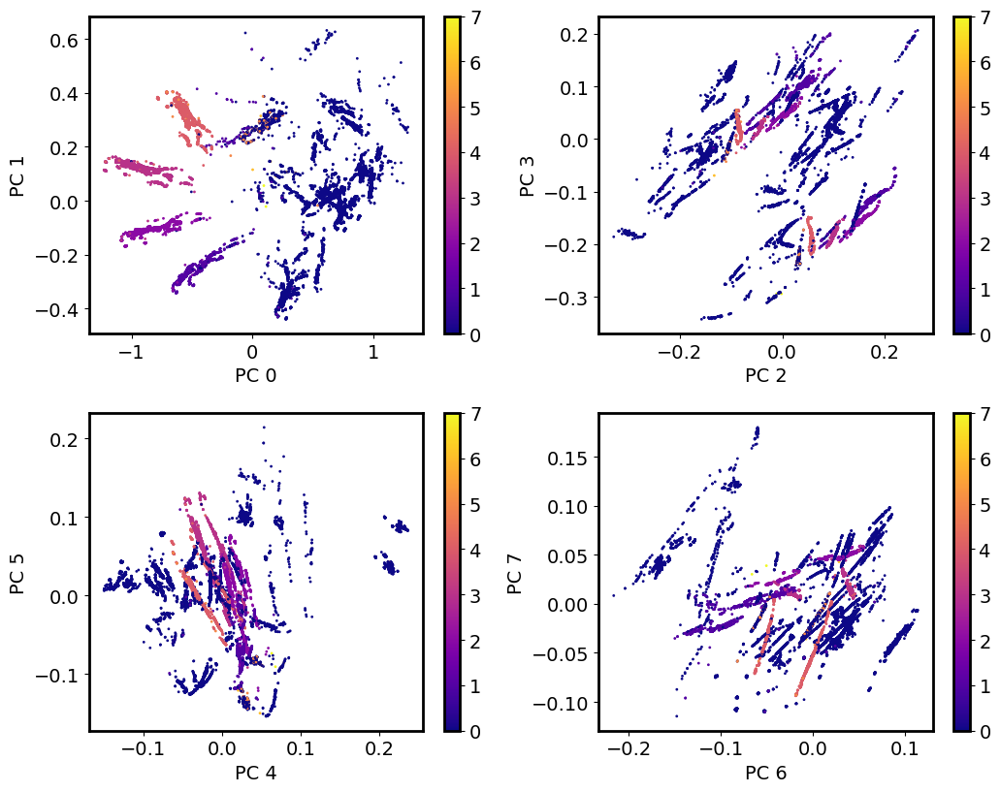

In [40]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(2, 2, figsize=(9 * scale, 7 * scale))

for k in np.arange(0, 8, 2):
    k_x, k_y = int(k/4), int(k/2) % 2
    cbar = axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :],
        pc_activities[k+1, env_idx, :],
        s=1,
        c=session_data['dwell_time'],
        cmap='plasma',
        # vmax=2,
    )
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
fig.tight_layout()

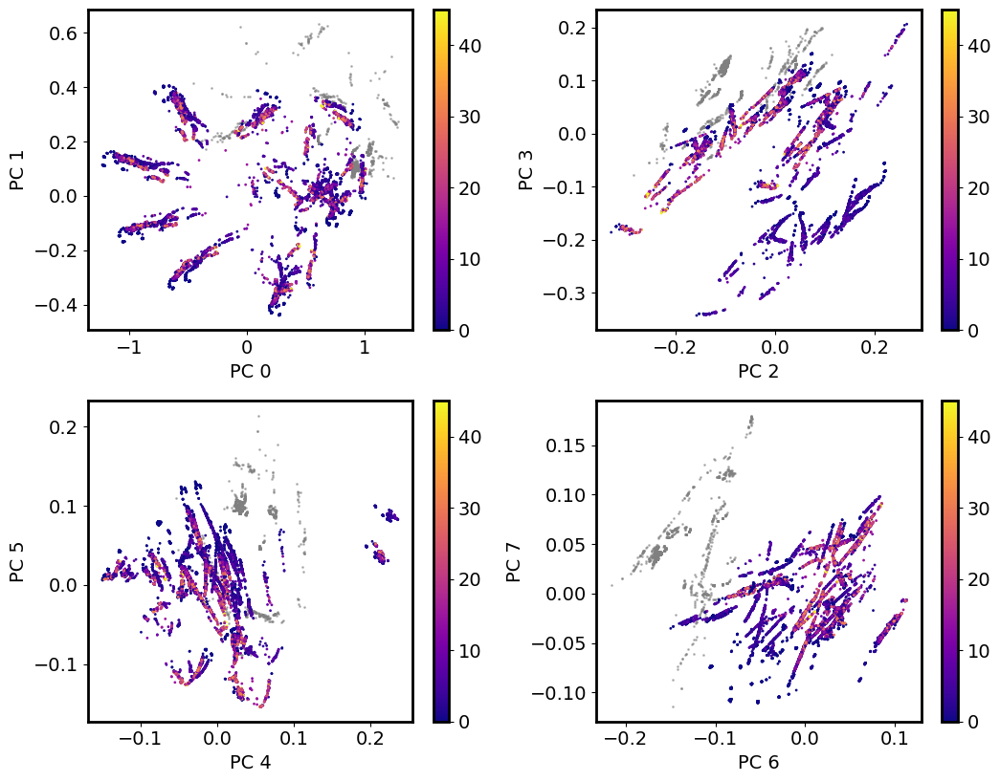

In [41]:
scale = 1.2
fig, axs = plt.subplots(2, 2, figsize=(9 * scale, 7 * scale))

for k in np.arange(0, 8, 2):
    k_x, k_y = int(k/4), int(k/2) % 2
    cbar = axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][session_data['agent_in_patch'] <= 0],
        pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] <= 0],
        s=1,
        c='grey',
        alpha=0.5,
        # vmax=2,
    )
    cbar = axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][session_data['agent_in_patch'] > 0],
        pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] > 0],
        s=1,
        c=session_data['rewards_seen_in_patch'][session_data['agent_in_patch'] > 0],
        cmap='plasma',
        vmin=0,
    )
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
# axs[0, 0].set_title('Activity colored by rewards seen in patch')
fig.tight_layout()

In [19]:
env_idx = 180

data = load_numpy('../../results/rl_agent_outputs/acc_reward_test_he_130k_01_2025-02-11_13_58_08_176805_var_noise_0_activity_weight_0/hidden_state/*.npy')
data = np.transpose(data, [2, 1, 0])

print(data.shape)
flattened_data = data.reshape(data.shape[0], data.shape[1] * data.shape[2], order='C')

pca = PCA()
print(flattened_data.shape)
pc_activities = pca.fit_transform(flattened_data.T)
print('s:', pc_activities.T.shape)
pc_activities = pc_activities.T.reshape(data.shape, order='C')

session_data = parse_session(
    '../../results/rl_agent_outputs/acc_reward_test_he_130k_01_2025-02-11_13_58_08_176805_var_noise_0_activity_weight_0/state',
    env_idx=env_idx % 30,
)

explained_variance_ratios = pca.explained_variance_ratio_

(128, 210, 20000)
(128, 4200000)
s: (128, 4200000)
['00001.pkl', '00002.pkl', '00003.pkl', '00004.pkl', '00005.pkl', '00006.pkl', '00007.pkl']


Text(0.5, 0, 'PC')

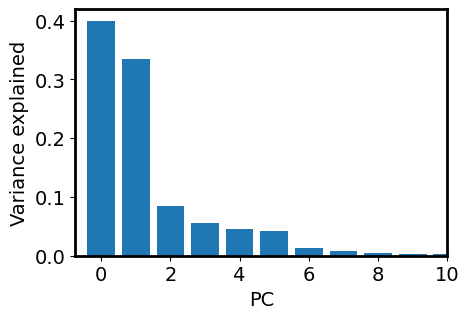

In [20]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

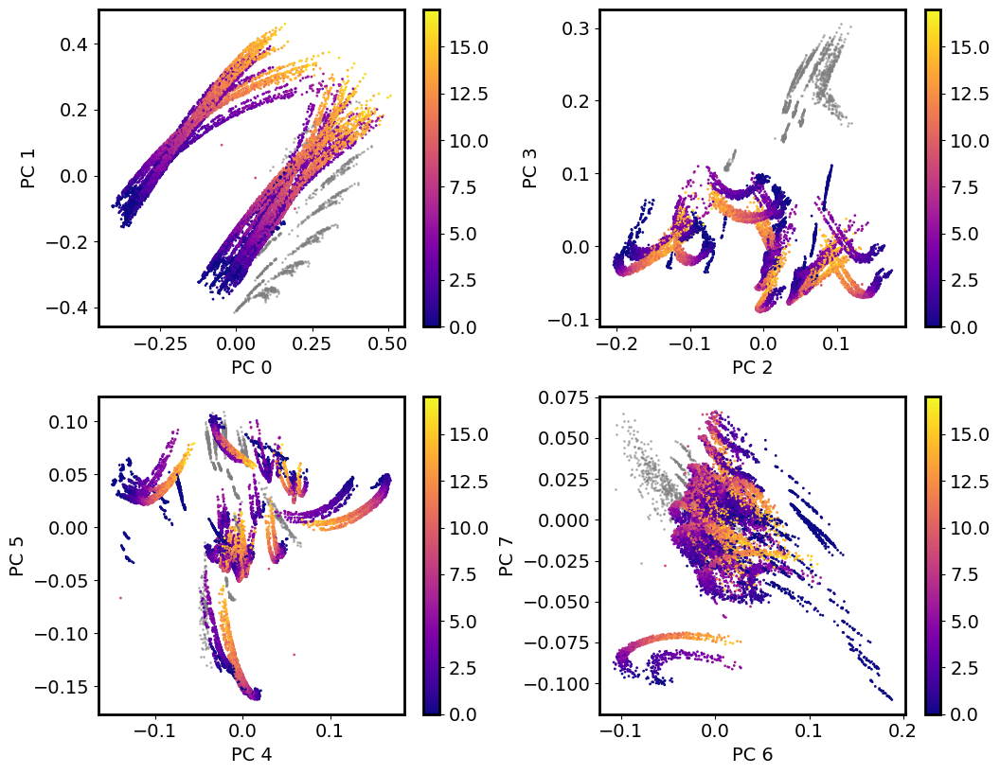

In [52]:
scale = 1.2
fig, axs = plt.subplots(2, 2, figsize=(9 * scale, 7 * scale))

for k in np.arange(0, 8, 2):
    k_x, k_y = int(k/4), int(k/2) % 2
    cbar = axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][session_data['agent_in_patch'] <= 0],
        pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] <= 0],
        s=1,
        c='grey',
        alpha=0.5,
        # vmax=2,
    )
    cbar = axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][session_data['agent_in_patch'] > 0],
        pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] > 0],
        s=1,
        c=session_data['rewards_seen_in_patch'][session_data['agent_in_patch'] > 0],
        cmap='plasma',
        vmin=0,
    )
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
# axs[0, 0].set_title('Activity colored by rewards seen in patch')
fig.tight_layout()

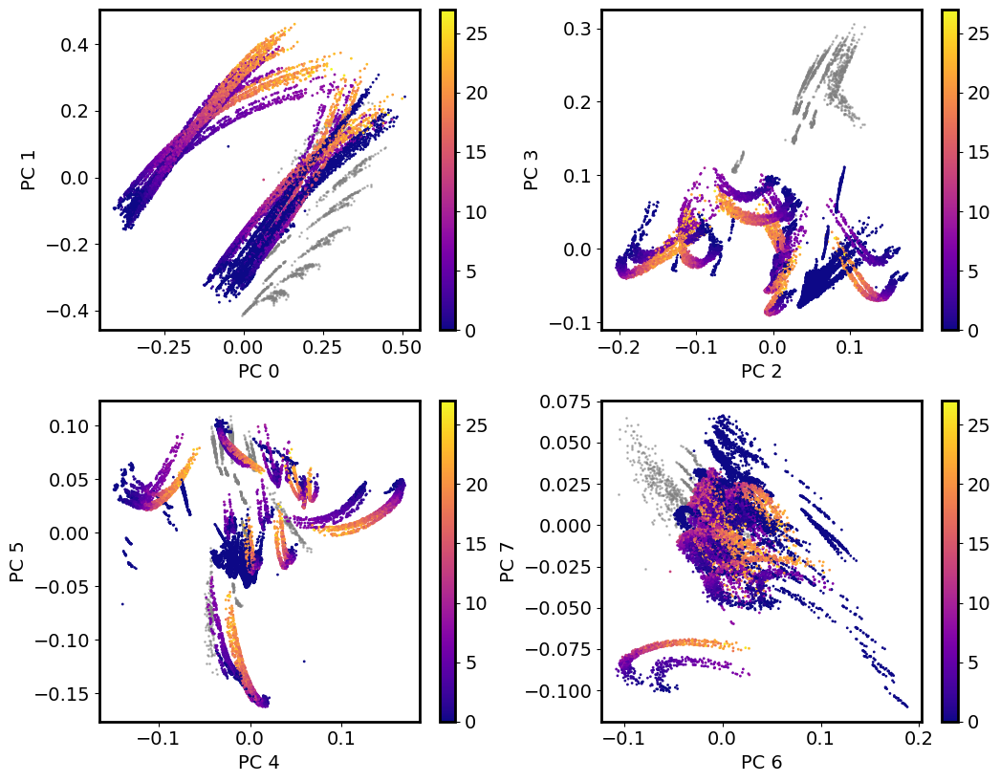

In [54]:
scale = 1.2
fig, axs = plt.subplots(2, 2, figsize=(9 * scale, 7 * scale))

for k in np.arange(0, 8, 2):
    k_x, k_y = int(k/4), int(k/2) % 2
    cbar = axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][session_data['agent_in_patch'] <= 0],
        pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] <= 0],
        s=1,
        c='grey',
        alpha=0.5,
        # vmax=2,
    )
    cbar = axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][session_data['agent_in_patch'] > 0],
        pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] > 0],
        s=1,
        c=session_data['reward_site_idx'][session_data['agent_in_patch'] > 0],
        cmap='plasma',
        vmin=0,
    )
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
# axs[0, 0].set_title('Activity colored by rewards seen in patch')
fig.tight_layout()

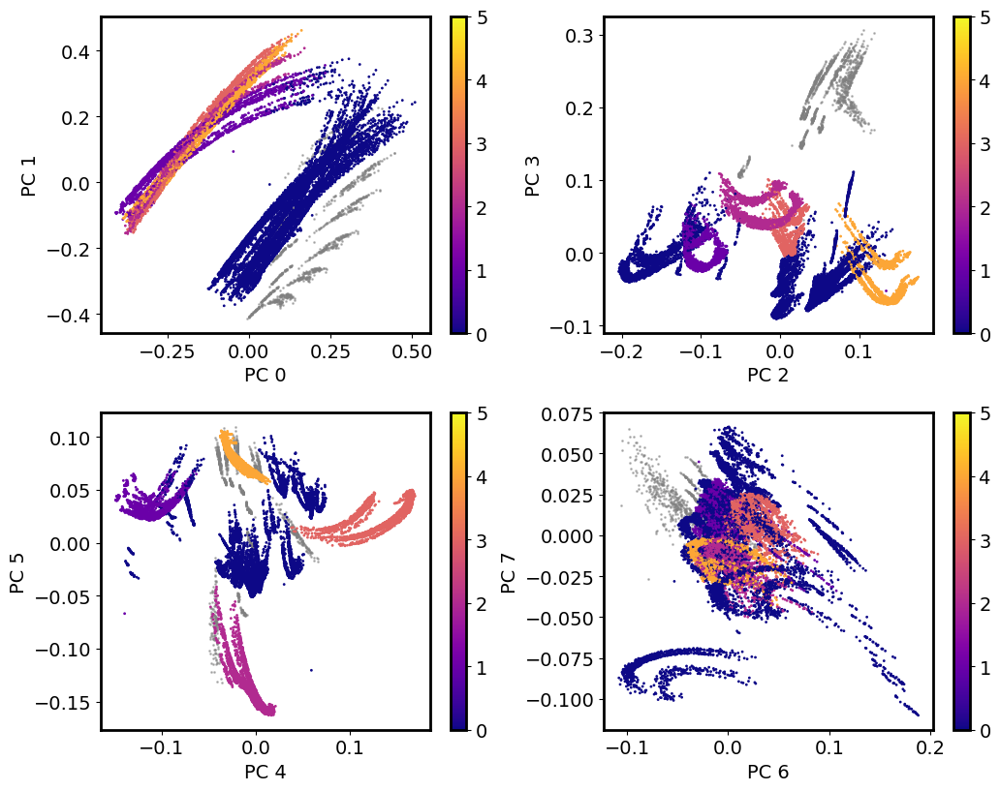

In [56]:
scale = 1.2
fig, axs = plt.subplots(2, 2, figsize=(9 * scale, 7 * scale))

for k in np.arange(0, 8, 2):
    k_x, k_y = int(k/4), int(k/2) % 2
    cbar = axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][session_data['agent_in_patch'] <= 0],
        pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] <= 0],
        s=1,
        c='grey',
        alpha=0.5,
        # vmax=2,
    )
    cbar = axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][session_data['agent_in_patch'] > 0],
        pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] > 0],
        s=1,
        c=session_data['dwell_time'][session_data['agent_in_patch'] > 0],
        cmap='plasma',
        vmin=0,
    )
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
# axs[0, 0].set_title('Activity colored by rewards seen in patch')
fig.tight_layout()

In [57]:
env_idx = 180

data = load_numpy('../../results/rl_agent_outputs/acc_reward_test_line_init_01_2025-02-12_13_10_17_431171_var_noise_0_activity_weight_0/hidden_state/*.npy')
data = np.transpose(data, [2, 1, 0])

print(data.shape)
flattened_data = data.reshape(data.shape[0], data.shape[1] * data.shape[2], order='C')

pca = PCA()
print(flattened_data.shape)
pc_activities = pca.fit_transform(flattened_data.T)
print('s:', pc_activities.T.shape)
pc_activities = pc_activities.T.reshape(data.shape, order='C')

session_data = parse_session(
    '../../results/rl_agent_outputs/acc_reward_test_line_init_01_2025-02-12_13_10_17_431171_var_noise_0_activity_weight_0/state',
    env_idx=env_idx % 30,
)

explained_variance_ratios = pca.explained_variance_ratio_

(128, 210, 20000)
(128, 4200000)
s: (128, 4200000)
['00001.pkl', '00002.pkl', '00003.pkl', '00004.pkl', '00005.pkl', '00006.pkl', '00007.pkl']


[ 0. 10. 30.]


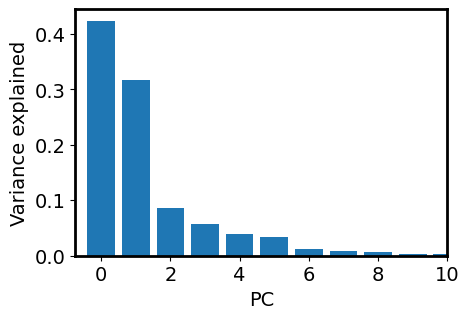

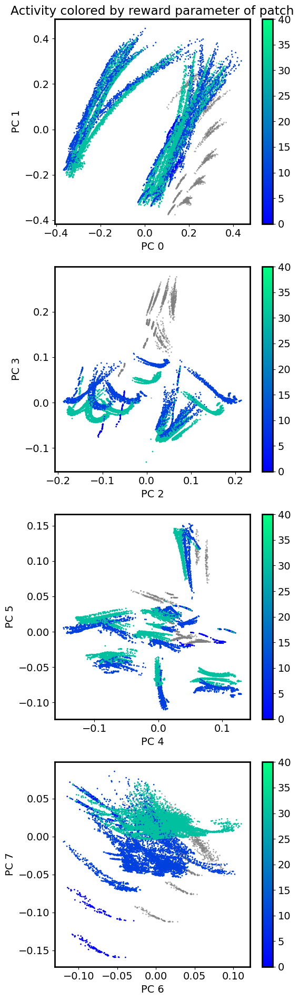

In [58]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))

print(np.unique(session_data['patch_reward_param'][session_data['agent_in_patch'] > 0]))


for k in np.arange(0, 8, 2):
    cbar = axs[int(k/2)].scatter(
        pc_activities[k, env_idx, :][session_data['agent_in_patch'] <= 0],
        pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] <= 0],
        s=1,
        c='grey',
        alpha=0.5,
        # vmax=2,
    )
    cbar = axs[int(k/2)].scatter(
        pc_activities[k, env_idx, :][session_data['agent_in_patch'] > 0],
        pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] > 0],
        s=1,
        c=session_data['patch_reward_param'][session_data['agent_in_patch'] > 0],
        cmap='winter',
        vmin=0,
        vmax=40
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
axs[0].set_title('Activity colored by reward parameter of patch')
fig.tight_layout()

(128, 210, 20000)


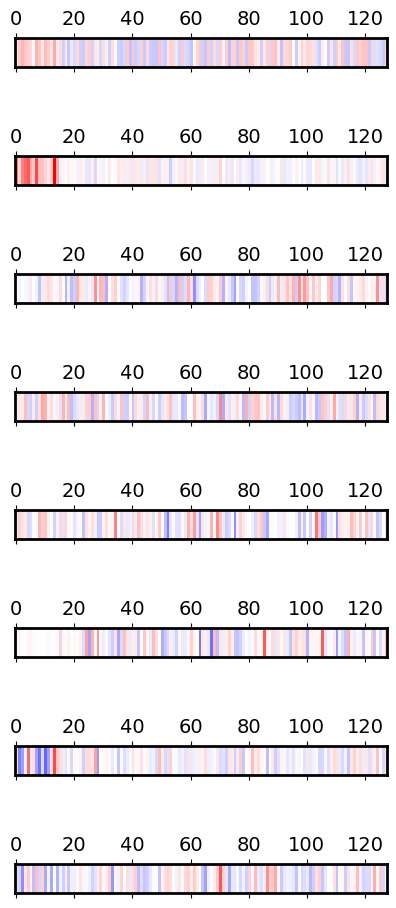

In [60]:
print(pc_activities.shape)
explained_variance_ratios = pca.explained_variance_ratio_
pca.components_

scale = 0.8
fig, axs = plt.subplots(8, 1, figsize=(6 * scale, 15 * scale))

for i in range(8):
    axs[i].matshow(pca.components_[i, :, np.newaxis].T, aspect=10, cmap='bwr', vmin=-0.5, vmax=0.5)
    axs[i].set_yticks([])

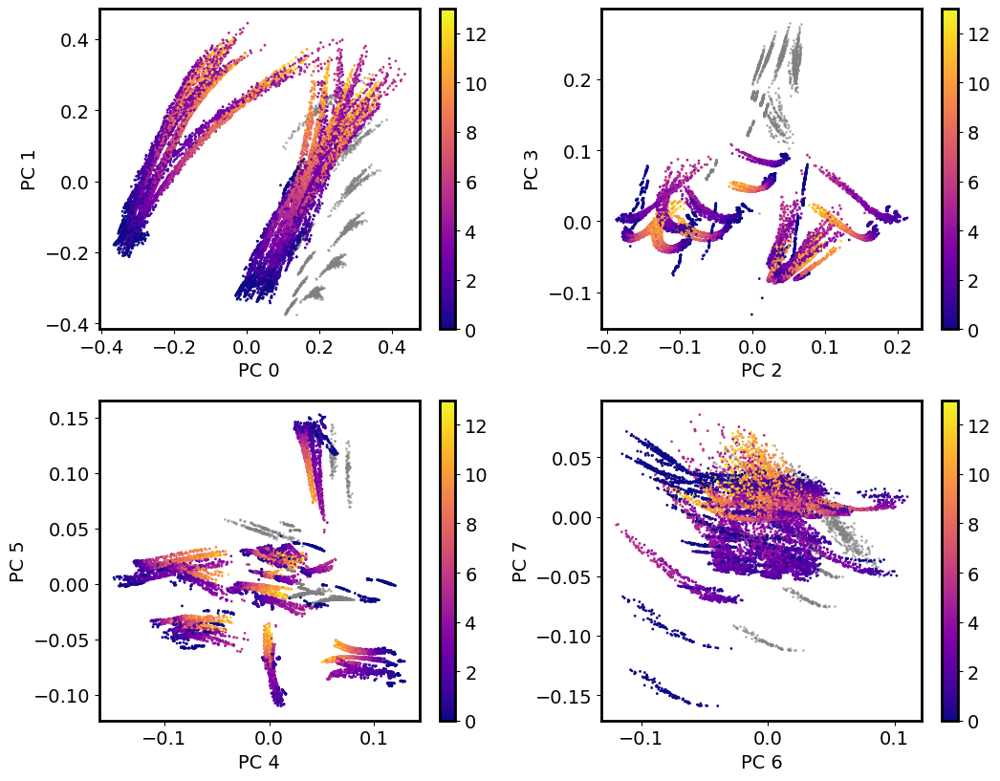

In [61]:
scale = 1.2
fig, axs = plt.subplots(2, 2, figsize=(9 * scale, 7 * scale))

for k in np.arange(0, 8, 2):
    k_x, k_y = int(k/4), int(k/2) % 2
    cbar = axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][session_data['agent_in_patch'] <= 0],
        pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] <= 0],
        s=1,
        c='grey',
        alpha=0.5,
        # vmax=2,
    )
    cbar = axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][session_data['agent_in_patch'] > 0],
        pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] > 0],
        s=1,
        c=session_data['rewards_seen_in_patch'][session_data['agent_in_patch'] > 0],
        cmap='plasma',
        vmin=0,
    )
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
# axs[0, 0].set_title('Activity colored by rewards seen in patch')
fig.tight_layout()

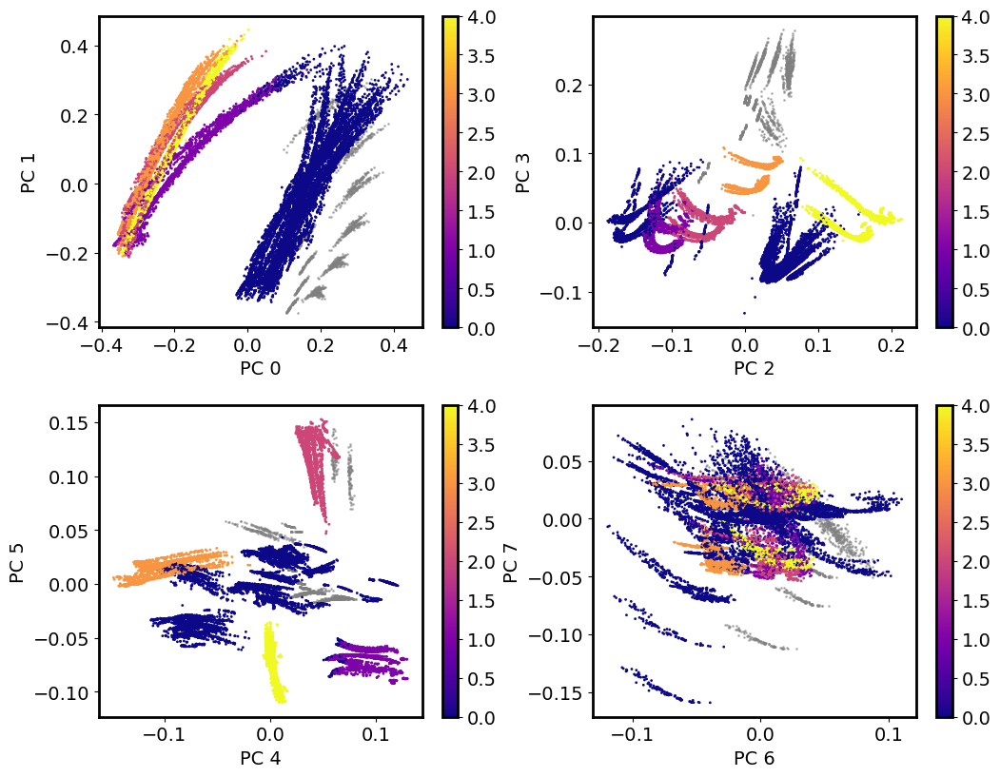

In [62]:
scale = 1.2
fig, axs = plt.subplots(2, 2, figsize=(9 * scale, 7 * scale))

for k in np.arange(0, 8, 2):
    k_x, k_y = int(k/4), int(k/2) % 2
    cbar = axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][session_data['agent_in_patch'] <= 0],
        pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] <= 0],
        s=1,
        c='grey',
        alpha=0.5,
        # vmax=2,
    )
    cbar = axs[k_x, k_y].scatter(
        pc_activities[k, env_idx, :][session_data['agent_in_patch'] > 0],
        pc_activities[k+1, env_idx, :][session_data['agent_in_patch'] > 0],
        s=1,
        c=session_data['dwell_time'][session_data['agent_in_patch'] > 0],
        cmap='plasma',
        vmin=0,
    )
    axs[k_x, k_y].set_xlabel(f'PC {k}')
    axs[k_x, k_y].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
# axs[0, 0].set_title('Activity colored by rewards seen in patch')
fig.tight_layout()